#                     Project Title: NIK Fuzzy Factory eCommerce Database Analysis

**Overview:**

Welcome to a groundbreaking project that goes beyond the conventional realm of SQL. In the NIK Fuzzy Factory eCommerce Database Analysis project, we will delve into a meticulously crafted eCommerce database tailored for real-world applications. Unlike generic examples, this project immerses you in the role of a Database Analyst at NIK Fuzzy Factory, an innovative eCommerce start-up.


**Project Objectives:**

As a Database Analyst for NIK Fuzzy Factory, you will collaborate directly with the CEO, Marketing Director, and Website Manager. Your primary goal is to leverage advanced SQL tools and techniques to analyze and enhance business performance.


#### Key Areas of Analysis:

**1.	Analyzing Traffic Sources:**
•	Identify Top Traffic Sources
•	Analyze Traffic Conversion Rates
•	Explore Traffic Source Trending
•	Optimize Traffic Source Bids
•	Segment Traffic Source Trending

**2.	Analyzing Website Performance:**
•	Identify Top Website Pages
•	Determine Top Entry Pages
•	Calculate Bounce Rates
•	Analyze Landing Page Tests
•	Conduct Landing Page Trend Analysis
•	Build Conversion Funnels
•	Analyze Conversion Funnel Tests

**3.	Channel Management Analysis:**
•	Analyze Channel Portfolios
•	Compare Channel Characteristics
•	Optimize Bids Across Channels
•	Explore Channel Portfolio Trends
•	Analyze Free Channels

**4.	Business Patterns & Seasonality Analysis:**
•	Analyze Seasonality Trends
•	Identify Business Patterns
•	Uncover Seasonal Business Patterns

**5.	Product Analysis:**
•	Conduct Product Level Sales Analysis
•	Analyze Product Launch Sales
•	Examine Product Pathing
•	Build Product Conversion Funnels
•	Cross-Sell Analysis
•	Portfolio Expansion Analysis
•	Analyze Product Refund Rates

**6.	User Analysis:**
•	Identify Repeat Visitors
•	Analyze Repeat Behavior
•	Explore New vs. Repeat Channel Patterns
•	Evaluate New vs. Repeat Performance


In [4]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import matplotlib as mpl
import pandas as pd
from matplotlib.patheffects import withSimplePatchShadow 

In [470]:
# Load each file individually
order_item_refunds = pd.read_csv('order_item_refunds.csv')
order_items = pd.read_csv('order_items.csv')
orders = pd.read_csv('orders.csv')
products = pd.read_csv('products.csv')
website_pageviews = pd.read_csv('website_pageviews.csv')
website_sessions = pd.read_csv('website_sessions.csv')

# Example: display first few rows from each
print("order_item_refunds:")
display(order_item_refunds.head())

print("order_items:")
display(order_items.head())

print("orders:")
display(orders.head())

print("products:")
display(products.head())

print("website_pageviews:")
display(website_pageviews.head())

print("website_sessions:")
display(website_sessions.head())

order_item_refunds:


,order_item_refund_id,created_at,order_item_id,order_id,refund_amount_usd
0,1,2012-04-06 11:32:43,57,57,49.99
1,2,2012-04-13 01:09:43,74,74,49.99
2,3,2012-04-15 07:03:48,71,71,49.99
3,4,2012-04-17 20:00:37,118,118,49.99
4,5,2012-04-22 20:53:49,116,116,49.99


order_items:


,order_item_id,created_at,order_id,product_id,is_primary_item,price_usd,cogs_usd
0,1,2012-03-19 10:42:46,1,1,1,49.99,19.49
1,2,2012-03-19 19:27:37,2,1,1,49.99,19.49
2,3,2012-03-20 06:44:45,3,1,1,49.99,19.49
3,4,2012-03-20 09:41:45,4,1,1,49.99,19.49
4,5,2012-03-20 11:28:15,5,1,1,49.99,19.49


orders:


,order_id,created_at,website_session_id,user_id,primary_product_id,items_purchased,price_usd,cogs_usd
0,1,2012-03-19 10:42:46,20,20,1,1,49.99,19.49
1,2,2012-03-19 19:27:37,104,104,1,1,49.99,19.49
2,3,2012-03-20 06:44:45,147,147,1,1,49.99,19.49
3,4,2012-03-20 09:41:45,160,160,1,1,49.99,19.49
4,5,2012-03-20 11:28:15,177,177,1,1,49.99,19.49


products:


,product_id,created_at,product_name
0,1,2012-03-19 08:00:00,The Original Mr. Fuzzy
1,2,2013-01-06 13:00:00,The Forever Love Bear
2,3,2013-12-12 09:00:00,The Birthday Sugar Panda
3,4,2014-02-05 10:00:00,The Hudson River Mini bear


website_pageviews:


,website_pageview_id,created_at,website_session_id,pageview_url
0,1,2012-03-19 08:04:16,1,/home
1,2,2012-03-19 08:16:49,2,/home
2,3,2012-03-19 08:26:55,3,/home
3,4,2012-03-19 08:37:33,4,/home
4,5,2012-03-19 09:00:55,5,/home


website_sessions:


,website_session_id,created_at,user_id,is_repeat_session,utm_source,utm_campaign,utm_content,device_type,http_referer
0,1,2012-03-19 08:04:16,1,0,gsearch,nonbrand,g_ad_1,mobile,https://www.gsearch.com
1,2,2012-03-19 08:16:49,2,0,gsearch,nonbrand,g_ad_1,desktop,https://www.gsearch.com
2,3,2012-03-19 08:26:55,3,0,gsearch,nonbrand,g_ad_1,desktop,https://www.gsearch.com
3,4,2012-03-19 08:37:33,4,0,gsearch,nonbrand,g_ad_1,desktop,https://www.gsearch.com
4,5,2012-03-19 09:00:55,5,0,gsearch,nonbrand,g_ad_1,mobile,https://www.gsearch.com


#### About The Dataset:

We will be working with six related tables, which contain eCommerce data about: 
• Website Activity 
• Products 
• Orders and Refunds 

We'll use MySQL to understand how customers access and interact with the site, analyze landing page performance and conversion, and explore product-level sales.
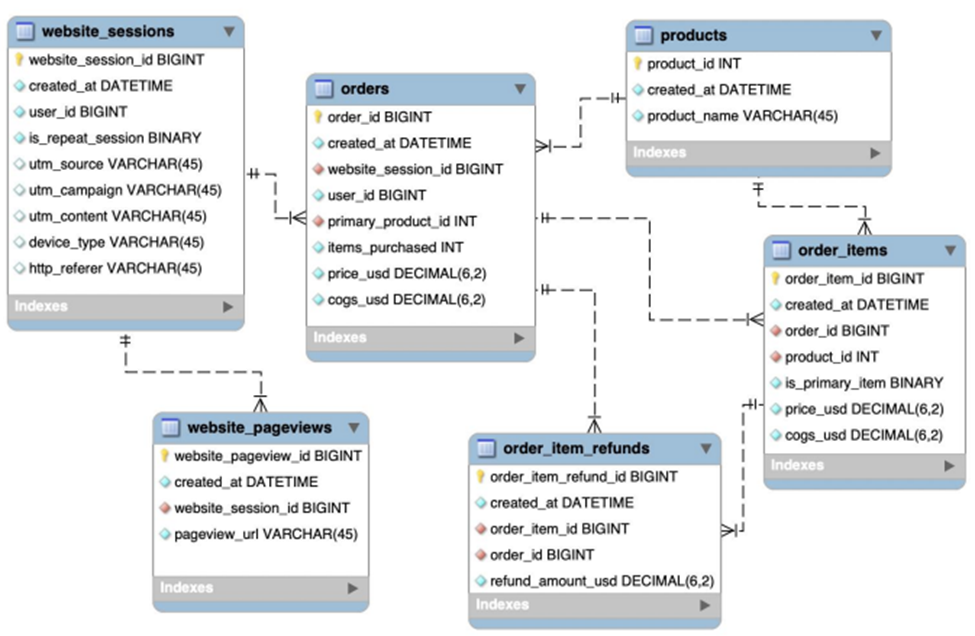

#### Analyzing Traffic Sources:
Traffic source analysis is like figuring out where your customers are coming from. It’s a key part of your marketing plan. You want to know which places (or “channels”) are bringing in the most customers. You also want to find out which of these channels are bringing in the best customers.
To do this, you look at how users interact with your site or product and how often they end up buying something or signing up (this is called “conversion”). By understanding all this, you can make your marketing even better.

 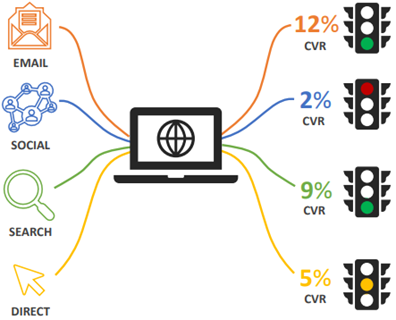

#### COMMON USE CASES: 
•	Looking at search data and moving money towards the search engines, campaigns, or keywords that are leading to the most sales or sign-ups.
•	Checking how users behave depending on where they came from and using this information to decide what kind of ads or messages to use.
•	Finding chances to stop spending money where it’s not working or put more money into areas where it’s leading to a lot of sales or sign-ups.


#### About WEBSITE_SESSION table:
 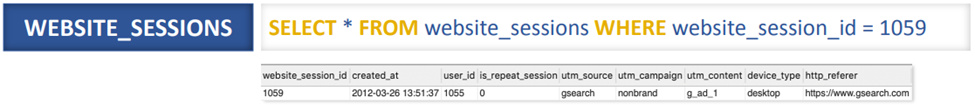
 
**What is UTM?**

When businesses run paid marketing campaigns, they often obsess over performance and measure everything; how much they spend, how well traffic converts to sales, etc. 

Paid traffic is commonly tagged with tracking (UTM) parameters, which are appended to URLs and allow us to tie website activity back to specific traffic sources and campaigns.
 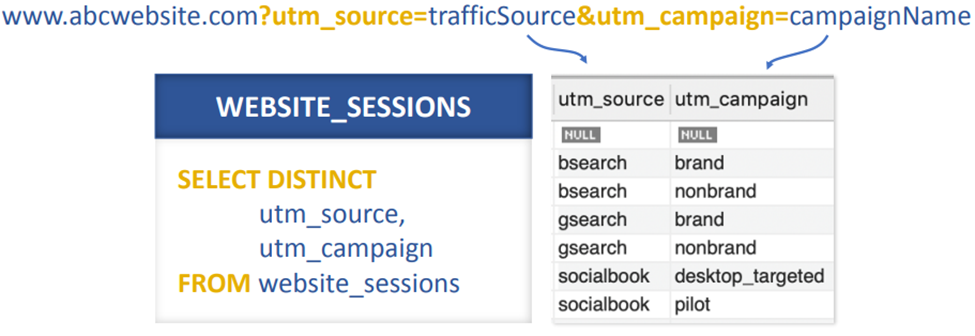
• We use the UTM parameters stored in the database to identify paid website sessions 

• From our session data, we can link to our order data to understand how much revenue our paid campaigns are driving


# FINDING TOP TRAFFIC SOURCES


*April 12, 2012*

Can you share some information about where your website’s visitors have been coming from over the past month? Specifically, could you break down the data by UTM source (the website they came from), campaign (the specific ad or promotion they clicked on), and referring domain (the webpage that led them to your website) up until yesterday? This information could be helpful for understanding how people are finding your website and how to make your marketing strategies even better.


### Filter the Data

In [12]:
# Convert created_at to datetime if not already
website_sessions['created_at'] = pd.to_datetime(website_sessions['created_at'])

# Filter for dates before April 12, 2012
filtered_df = website_sessions[website_sessions['created_at'] < '2012-04-12']

### Group and Aggregate

In [14]:
# Group by the three columns and count distinct session IDs
result = filtered_df.groupby(['utm_source', 'utm_campaign', 'http_referer'])['website_session_id'] \
                   .nunique() \
                   .reset_index(name='sessions') \
                   .sort_values('sessions', ascending=False)

### Bar Plot of Top Sessions

C:\Users\SAGNIK\AppData\Local\Temp\ipykernel_9936\2896101299.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_results['source_campaign'] = top_results['utm_source'] + ' - ' + top_results['utm_campaign']


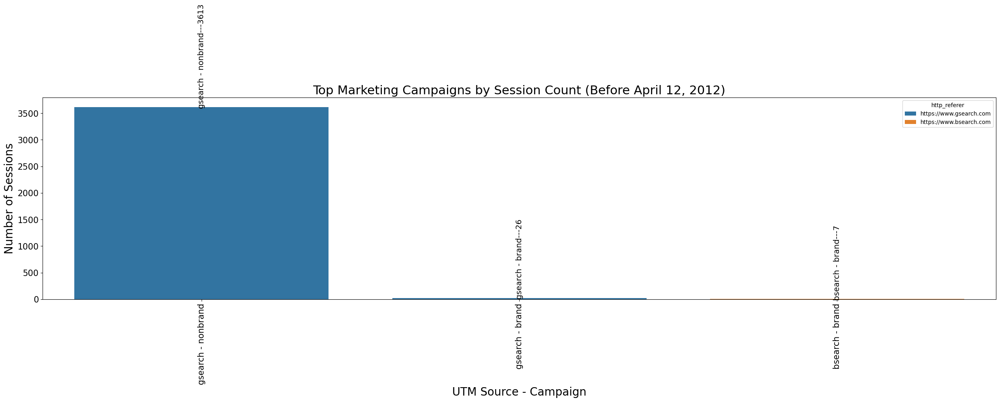

In [16]:
plt.figure(figsize=(25, 10))
top_results = result.head(10)  # Show top 10 for clarity

# Create a combined label for the x-axis
top_results['source_campaign'] = top_results['utm_source'] + ' - ' + top_results['utm_campaign']

g = sns.barplot(x='source_campaign', y='sessions', hue='http_referer', data=top_results)

index = 0
for value in top_results['sessions'].values:
    label = top_results['source_campaign'].values[index] + '---' + str(value)
    g.text(index, value + 5, label, color='#000', size=14, rotation=90, ha="center")
    index += 1

plt.title('Top Marketing Campaigns by Session Count (Before April 12, 2012)', fontsize=22)
plt.xlabel('UTM Source - Campaign', fontsize=20)
plt.ylabel('Number of Sessions', fontsize=20)
plt.xticks(rotation=90)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.tight_layout()
plt.show()


Findings:

The results show that we should focus more on “gsearch nonbrand.” If we look into this more, we might find ways to do better and fine-tune our plans. This could possibly lead to more people visiting our website and more successful conversions.


# TRAFFIC CONVERSION RATES

*April 14, 2012*

Can you find out how many people who come to our site from “gsearch nonbrand” actually buy something? We want to figure out the conversion rate. If less than 4% of these visitors are buying something, we might need to cut down on our spending. But if more than 4% are buying, we could think about spending more to bring in even more visitors?


In [20]:
# Convert date columns
website_sessions['created_at'] = pd.to_datetime(website_sessions['created_at'])

### Filter and Merge Data

In [22]:
# Filter for gsearch nonbrand sessions before April 14, 2012
gsearch_nonbrand = website_sessions[
    (website_sessions['created_at'] < '2012-04-14') &
    (website_sessions['utm_source'] == 'gsearch') &
    (website_sessions['utm_campaign'] == 'nonbrand')
]

# Merge with orders data
merged_data = pd.merge(
    gsearch_nonbrand,
    orders,
    on='website_session_id',
    how='left'
)

### Calculate Metrics

In [24]:
# Calculate key metrics
sessions = merged_data['website_session_id'].nunique()
orders = merged_data['order_id'].nunique()
conversion_rate = orders / sessions

print(f"Total Sessions: {sessions}")
print(f"Total Orders: {orders}")
print(f"Conversion Rate: {conversion_rate:.2%}")

Total Sessions: 3895
Total Orders: 112
Conversion Rate: 2.88%


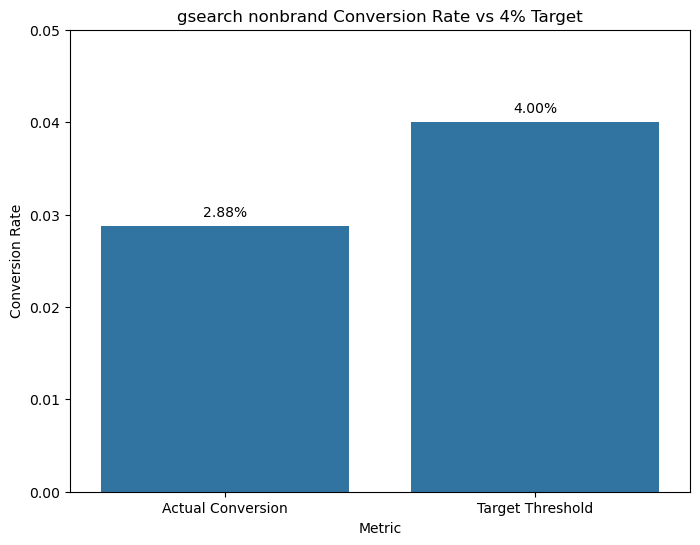

In [25]:
# Create a bar chart comparing actual vs target conversion
plt.figure(figsize=(8, 6))
metrics = pd.DataFrame({
    'Metric': ['Actual Conversion', 'Target Threshold'],
    'Rate': [conversion_rate, 0.04]
})

ax = sns.barplot(x='Metric', y='Rate', data=metrics)
plt.title('gsearch nonbrand Conversion Rate vs 4% Target')
plt.ylabel('Conversion Rate')
plt.ylim(0, 0.05)

# Add value labels
for p in ax.patches:
    ax.annotate(f'{p.get_height():.2%}', 
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 10),
                textcoords='offset points')

plt.show()

Findings:
 
The analysis indicates that we're currently below the 4% threshold needed to sustain our economics. Consequently, it would be advisable to dial down our search bids. This adjustment is necessary to align our spending with the existing conversion rate and avoid over-spending on the current performance metrics.


#### What is Bid Optimization?

Optimizing bids is like finding the best way to use your ad budget. We see which ads are bringing in the most customers and use information like how often they buy and how much money we make per click to decide how much to spend on each ad click.

We also look at how well our website and products are doing for different people, like those on mobile or desktop. This helps us put our money where it works best.

And when we change how much we’re willing to pay for ads, we see how it changes our place in ad auctions and how many people visit our site. This way, we make sure we’re using our budget smartly and getting the most bang for our buck.
 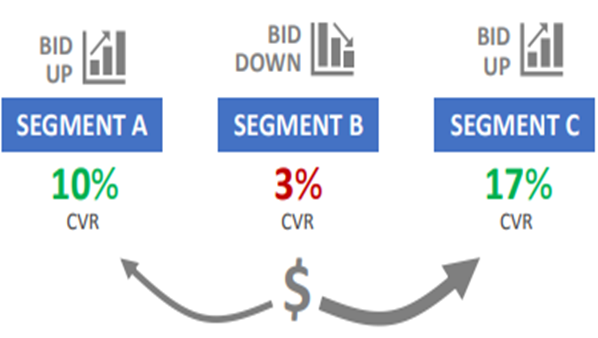


# TRAFFIC SOURCE TRENDING

*May 10, 2012*

Can you look at how many people visited our site from “gsearch nonbrand” each week? We want to know if the changes we made to our ad spending on April 15, 2012, affected how many people came to our site through this channel. Does that make sense?


In [30]:
# Filter for gsearch nonbrand before May 12, 2012
website_sessions['created_at'] = pd.to_datetime(website_sessions['created_at'])

gsearch_nonbrand = website_sessions[
    (website_sessions['created_at'] < '2012-05-12') &
    (website_sessions['utm_source'] == 'gsearch') &
    (website_sessions['utm_campaign'] == 'nonbrand')
]

### Aggregate Weekly Sessions

In [32]:
# Extract week start date (Monday) and count sessions
weekly_sessions = gsearch_nonbrand.set_index('created_at').resample('W-MON').agg({
    'website_session_id': 'nunique'
}).rename(columns={'website_session_id': 'sessions'}).reset_index()

weekly_sessions['week_start_date'] = weekly_sessions['created_at'].dt.date

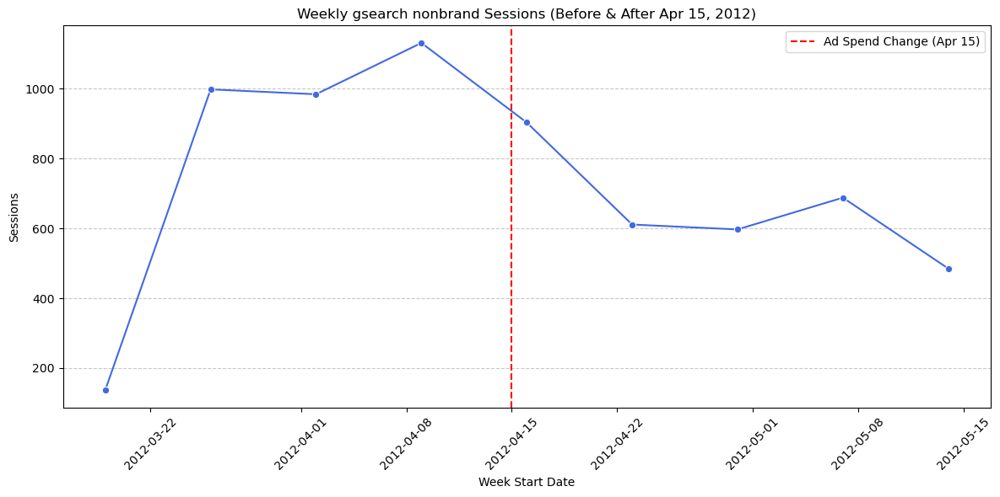

In [33]:
plt.figure(figsize=(12, 6))
sns.lineplot(
    x='week_start_date',
    y='sessions',
    data=weekly_sessions,
    marker='o',
    color='royalblue'
)

# Highlight April 15 change
plt.axvline(
    x=pd.to_datetime('2012-04-15'),
    color='red',
    linestyle='--',
    label='Ad Spend Change (Apr 15)'
)

plt.title('Weekly gsearch nonbrand Sessions (Before & After Apr 15, 2012)')
plt.xlabel('Week Start Date')
plt.ylabel('Sessions')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

Findings:
 
The study shows that “gsearch nonbrand” reacts well to changes in ad spending. While we want as many visitors as possible, we need to make sure we don’t spend more than our ad budget. This means we need to manage our ad spending carefully to get the most visitors without spending too much on ads.


# TRAFFIC SOURCE BID OPTIMIZATION

*May 11, 2012*

Have you looked at how often people who visit our site end up buying something, based on whether they’re using a mobile device or a desktop? If people are more likely to buy something when they visit our site on a desktop, should we think about spending more on ads for desktop users to bring in more visitors?


In [37]:
# Filter for gsearch nonbrand before May 11, 2012
orders = pd.read_csv('orders.csv')
sessions_filtered = website_sessions[
    (website_sessions['created_at'] < '2012-05-11') &
    (website_sessions['utm_source'] == 'gsearch') &
    (website_sessions['utm_campaign'] == 'nonbrand')
]

# Merge with orders data
merged_data = pd.merge(
    sessions_filtered,
    orders,
    on='website_session_id',
    how='left'
)

### Calculate Conversion Rates by Device Type

In [39]:
# Group by device_type and calculate metrics
conversion_rates = merged_data.groupby('device_type').agg({
    'website_session_id': 'nunique',
    'order_id': 'nunique'
}).rename(columns={
    'website_session_id': 'sessions',
    'order_id': 'orders'
})

conversion_rates['conversion_rate'] = conversion_rates['orders'] / conversion_rates['sessions']

C:\Users\SAGNIK\AppData\Local\Temp\ipykernel_9936\461233506.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


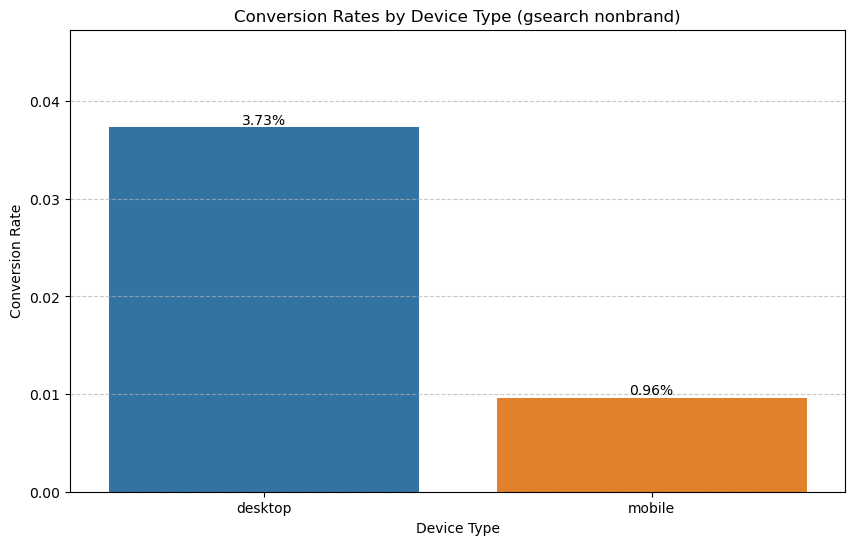

In [40]:
plt.figure(figsize=(10, 6))
sns.barplot(
    x=conversion_rates.index,
    y='conversion_rate',
    data=conversion_rates,
    palette=['#1f77b4', '#ff7f0e']  # Blue for desktop, orange for mobile
)

plt.title('Conversion Rates by Device Type (gsearch nonbrand)')
plt.xlabel('Device Type')
plt.ylabel('Conversion Rate')
plt.ylim(0, conversion_rates['conversion_rate'].max() + 0.01)  # Add padding

# Add value labels
for index, value in enumerate(conversion_rates['conversion_rate']):
    plt.text(index, value, f'{value:.2%}', ha='center', va='bottom')

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

Findings:
 
After looking at the data, I’ve decided we should spend more on ads for desktop users. The idea is that if we spend more, we can get a better spot in ad auctions. This should help us sell more, based on what we’ve seen so far. We’re making this change because we’ve noticed that desktop users tend to buy more. So, we’re hoping this will help us sell even more overall.


# TRAFFIC SOURCE SEGMENT TRENDING

*June 09, 2012*

Can you show us how the number of people visiting our site from both desktop and mobile has changed week by week, starting from April 15, 2012, up to May 19, 2012? We want to see if spending more on ads for our “gsearch nonbrand” desktop campaign has affected the number of people visiting our site from both desktop and mobile. Does that make sense?


### Filter Data

In [45]:
website_sessions['created_at'] = pd.to_datetime(website_sessions['created_at'])

filtered_sessions = website_sessions[
    (website_sessions['created_at'] >= '2012-04-15') & 
    (website_sessions['created_at'] <= '2012-05-19') &
    (website_sessions['utm_source'] == 'gsearch') &
    (website_sessions['utm_campaign'] == 'nonbrand')
]


### Aggregate Weekly Sessions by Device

In [47]:
# Extract week start date (Monday)
filtered_sessions['week_start_date'] = filtered_sessions['created_at'].dt.to_period('W').dt.start_time

# Pivot by device type
weekly_trends = filtered_sessions.groupby(['week_start_date', 'device_type'])['website_session_id'] \
    .nunique() \
    .unstack() \
    .fillna(0)

weekly_trends.columns = ['desktop_sessions', 'mobile_sessions']  # Rename for clarity

C:\Users\SAGNIK\AppData\Local\Temp\ipykernel_9936\4137862469.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_sessions['week_start_date'] = filtered_sessions['created_at'].dt.to_period('W').dt.start_time


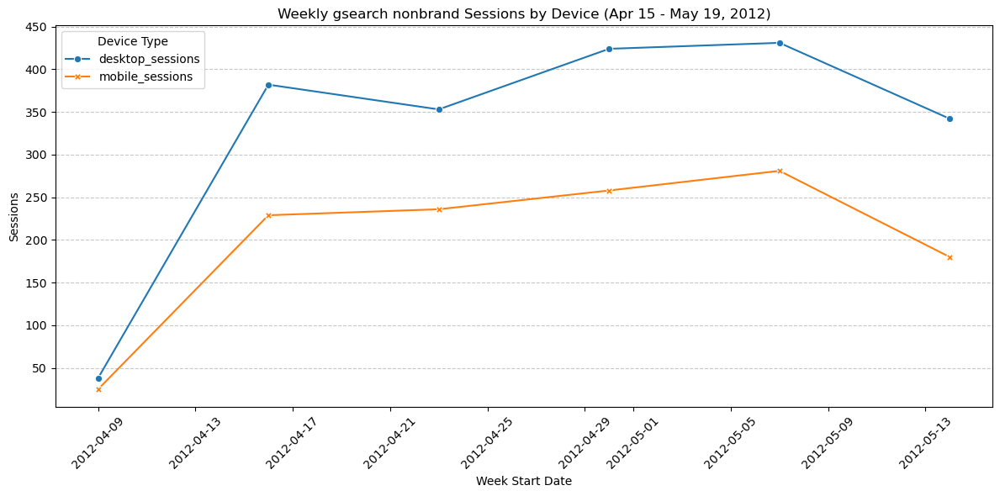

In [48]:
plt.figure(figsize=(12, 6))
sns.lineplot(
    data=weekly_trends,
    markers=True,
    dashes=False,
    palette=['#1f77b4', '#ff7f0e']  # Blue: desktop, Orange: mobile
)

plt.title('Weekly gsearch nonbrand Sessions by Device (Apr 15 - May 19, 2012)')
plt.xlabel('Week Start Date')
plt.ylabel('Sessions')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(title='Device Type')
plt.tight_layout()
plt.show()

Findings:
 

The study shows that the number of people visiting our site from mobile hasn’t changed much or has gone down a bit. But, we’ve seen a big increase in the number of people visiting from desktop. This increase is likely because of the changes we made to how much we’re willing to pay for desktop ads. These changes seem to be working well, as we’re seeing more people visit our site from desktop.


#### ANALYZING WEBSITE PERFORMANCE:

Website content analysis is like checking how users interact with your website to find ways to make your business better. This includes:

**1.	Finding Popular Pages:** Figuring out which pages on your website users visit the most. This helps you focus on content that your users really like.

**2.	Identifying Entry Pages:** Finding out the first pages users see when they come to your website. Knowing these pages is important for making sure users have a good experience right from the start.

**3.	Assessing Performance:** Checking how the most visited pages and the common entry pages help achieve your business goals. This helps make sure your website content plans line up with your overall business goals and that your website is doing what it’s supposed to do.
 
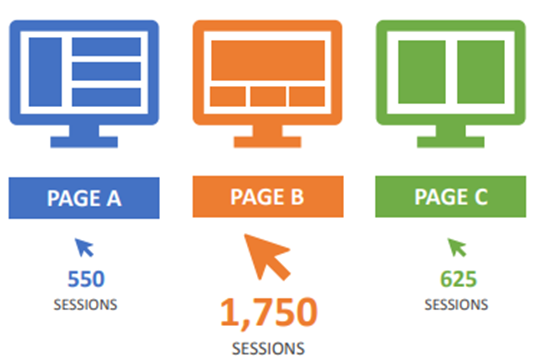

# IDENTIFYING TOP WEBSITE PAGES

*June 09, 2012*

Can you provide a list of the most-viewed pages on the website, ranked by the number of sessions? I'd like to better understand which pages are getting the most attention from users.



In [53]:
website_pageviews['created_at'] = pd.to_datetime(website_pageviews['created_at'])

# Filter for dates before June 9, 2012
filtered_pvs = website_pageviews[website_pageviews['created_at'] < '2012-06-09']

### Aggregate Pageviews by URL


In [55]:
# Group by page URL and count distinct pageview IDs
top_pages = filtered_pvs.groupby('pageview_url')['website_pageview_id'] \
                       .nunique() \
                       .reset_index(name='sessions') \
                       .sort_values('sessions', ascending=False)

C:\Users\SAGNIK\AppData\Local\Temp\ipykernel_9936\3231181256.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


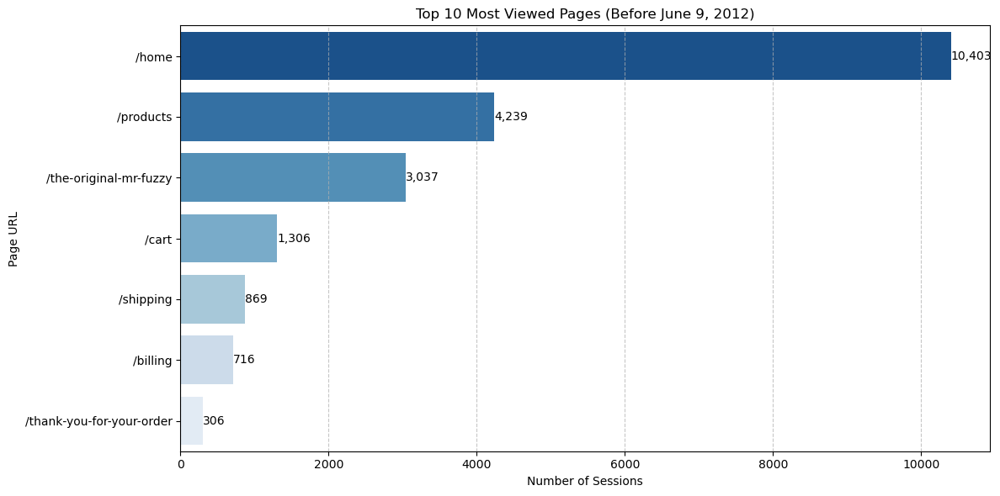

In [56]:
plt.figure(figsize=(12, 6))
top_10 = top_pages.head(10)  # Focus on top 10 pages

sns.barplot(
    x='sessions',
    y='pageview_url',  # Horizontal bar for better readability
    data=top_10,
    palette='Blues_r'
)

plt.title('Top 10 Most Viewed Pages (Before June 9, 2012)')
plt.xlabel('Number of Sessions')
plt.ylabel('Page URL')
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Add value labels
for index, value in enumerate(top_10['sessions']):
    plt.text(value, index, f'{value:,}', va='center')

plt.tight_layout()
plt.show()

Findings:
 
The analysis indicates that the homepage, products page, and the Mr. Fuzzy page are the primary drivers of our website traffic. These pages collectively attract the bulk of our visitors, signifying their significance in capturing user attention and interest.


# IDENTIFYING TOP ENTRY PAGES

*June 12, 2012*

Could you provide a list of the top entry pages on our website, ranked by the number of users hitting each page first? I want to confirm and understand the most common starting points for our users on the site.


In [60]:
website_pageviews['created_at'] = pd.to_datetime(website_pageviews['created_at'])

# Filter for dates before June 12, 2012
filtered_pvs = website_pageviews[website_pageviews['created_at'] < '2012-06-12']

### Identify First Pageviews per Session

In [62]:
# Find the first pageview for each session
first_pageviews = filtered_pvs.groupby('website_session_id')['website_pageview_id'].min().reset_index()
first_pageviews.rename(columns={'website_pageview_id': 'min_pageview_id'}, inplace=True)

### Merge with Page URLs

In [64]:
# Merge to get the URLs of first pageviews
landing_pages = pd.merge(
    first_pageviews,
    website_pageviews[['website_pageview_id', 'pageview_url']],
    left_on='min_pageview_id',
    right_on='website_pageview_id',
    how='left'
)

### Count Sessions per Landing Page

In [66]:
# Aggregate and sort
top_entry_pages = landing_pages.groupby('pageview_url')['website_session_id'] \
                             .count() \
                             .reset_index(name='sessions') \
                             .sort_values('sessions', ascending=False)

C:\Users\SAGNIK\AppData\Local\Temp\ipykernel_9936\489849512.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


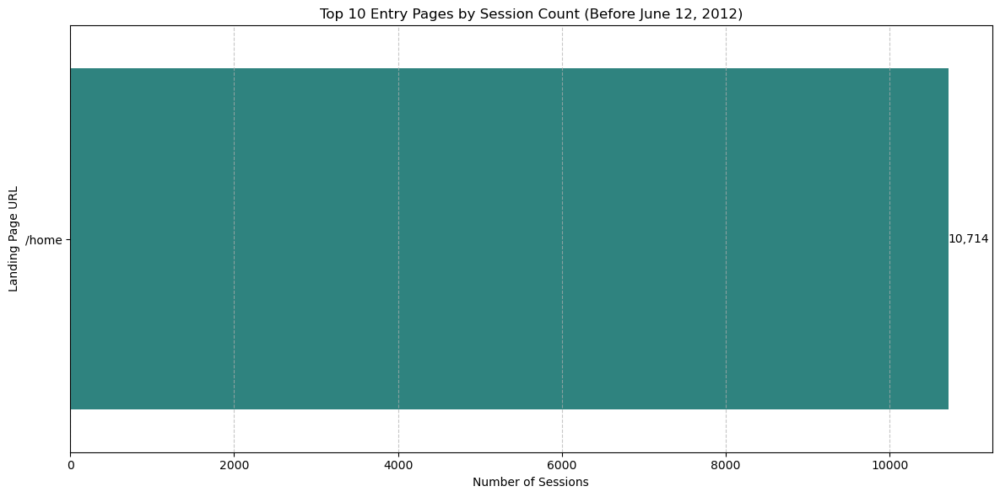

In [67]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 6))
top_10 = top_entry_pages.head(10)

sns.barplot(
    x='sessions',
    y='pageview_url',
    data=top_10,
    palette='viridis'
)

plt.title('Top 10 Entry Pages by Session Count (Before June 12, 2012)')
plt.xlabel('Number of Sessions')
plt.ylabel('Landing Page URL')
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Add value labels
for index, value in enumerate(top_10['sessions']):
    plt.text(value, index, f'{value:,}', va='center')

plt.tight_layout()
plt.show()

Findings:
 .

The data reveals that the majority of our traffic enters through the homepage. This clear pattern indicates a key area for improvement. Focusing on enhancements to the homepage would likely have a significant impact on the overall user experience and engagement with our website.


### What Is Landing Page Performance & Testing?

Analyzing and testing landing pages is about checking how good our key landing pages are and trying to make them even better. Here’s how we do it:
**1.	Finding Opportunities:** We look for pages that have a lot of visitors but aren’t keeping them engaged or getting them to do what we want. These are the pages we can work on to make better.

**2.	Testing Different Versions:** We try out different versions of these pages while people are using our website. We change up the design or content to see if we can get visitors to stay longer or do what we want more often.

**3.	Checking the Results:** After we’ve done our tests, we see which version of the landing page does the best job. Then, we choose to use the version that gives us the best results going forward. This helps us make our website work better and get more from our visitors.

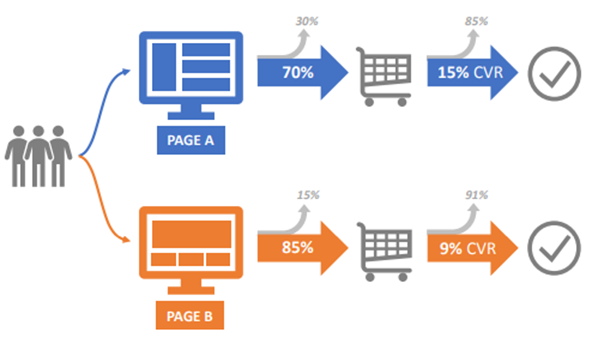


# CALCULATING BOUNCE RATES

*June 14, 2012*

Can you check how well our homepage is doing? Can you find out how many people visit it, how many leave right away, and what percentage of visitors leave without clicking on anything else (this is called the “Bounce Rate”)? We want to see these three numbers to understand how our homepage is performing. Does that make sense?
                                                                                                                 
                                                                                            *Refer Identifying Top Website Pages*


In [72]:
# Convert dates
website_pageviews['created_at'] = pd.to_datetime(website_pageviews['created_at'])
website_sessions['created_at'] = pd.to_datetime(website_sessions['created_at'])

### Find First Pageviews

In [74]:
first_pageviews = website_pageviews[website_pageviews['created_at'] < '2012-06-14'] \
    .groupby('website_session_id')['website_pageview_id'] \
    .min() \
    .reset_index() \
    .rename(columns={'website_pageview_id': 'min_pageview_id'})

print("First Pageviews Table:")
display(first_pageviews.head(19))

First Pageviews Table:


,website_session_id,min_pageview_id
0,1,1
1,2,2
2,3,3
3,4,4
4,5,5
5,6,6
6,7,7
7,8,12
8,9,14
9,10,15


### Identify Homepage Landings

In [76]:
homepage_landings = pd.merge(
    first_pageviews,
    website_pageviews[['website_pageview_id', 'pageview_url']],
    left_on='min_pageview_id',
    right_on='website_pageview_id'
).query("pageview_url == '/home'")[['website_session_id', 'pageview_url']]

print("\nHomepage Landing Sessions Table:")
display(homepage_landings.head(19))


Homepage Landing Sessions Table:


,website_session_id,pageview_url
0,1,/home
1,2,/home
2,3,/home
3,4,/home
4,5,/home
5,6,/home
6,7,/home
7,8,/home
8,9,/home
9,10,/home


### Find Bounced Sessions

In [78]:
pageview_counts = website_pageviews.groupby('website_session_id')['website_pageview_id'].count().reset_index()

bounced_sessions = pd.merge(
    homepage_landings,
    pageview_counts,
    on='website_session_id'
).query("website_pageview_id == 1")[['website_session_id', 'pageview_url']]

print("\nBounced Sessions Table:")
display(bounced_sessions.head(19))


Bounced Sessions Table:


,website_session_id,pageview_url
0,1,/home
1,2,/home
2,3,/home
3,4,/home
4,5,/home
6,7,/home
7,8,/home
8,9,/home
9,10,/home
10,11,/home


### Calculate Metrics

In [80]:
total_sessions = len(homepage_landings)
bounced = len(bounced_sessions)
bounce_rate = bounced / total_sessions

print(f"""
Homepage Performance (Before June 14, 2012):
- Total Sessions: {total_sessions:,}
- Bounced Sessions: {bounced:,}
- Bounce Rate: {bounce_rate:.2%}
""")


Homepage Performance (Before June 14, 2012):
- Total Sessions: 11,048
- Bounced Sessions: 6,538
- Bounce Rate: 59.18%



C:\Users\SAGNIK\AppData\Local\Temp\ipykernel_9936\4143821490.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Metric', y='Count', data=metrics, palette=['#1f77b4', '#d62728'])


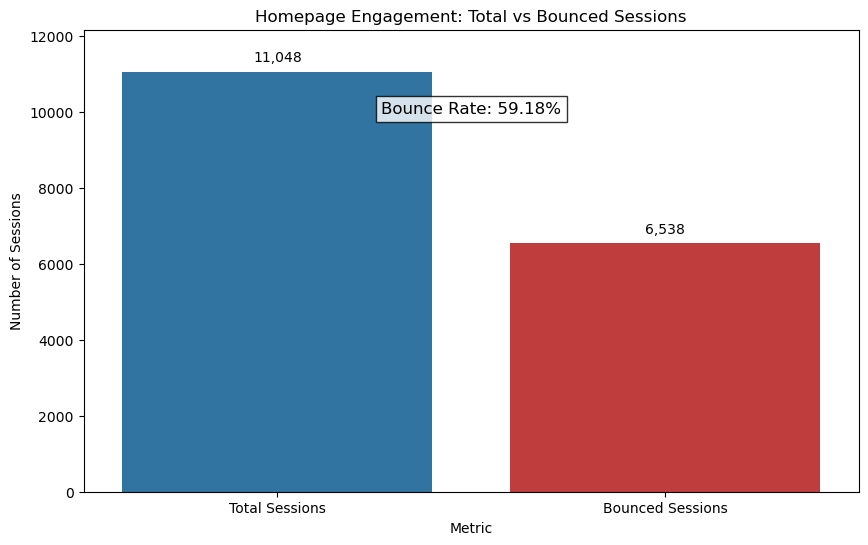

In [81]:
# Create comparison chart
metrics = pd.DataFrame({
    'Metric': ['Total Sessions', 'Bounced Sessions'],
    'Count': [total_sessions, bounced]
})

plt.figure(figsize=(10, 6))
sns.barplot(x='Metric', y='Count', data=metrics, palette=['#1f77b4', '#d62728'])
plt.title('Homepage Engagement: Total vs Bounced Sessions')
plt.ylabel('Number of Sessions')
plt.ylim(0, total_sessions * 1.1)

# Add value labels
for p in plt.gca().patches:
    plt.gca().annotate(f"{p.get_height():,.0f}", 
                      (p.get_x() + p.get_width() / 2., p.get_height()),
                      ha='center', va='center',
                      xytext=(0, 10),
                      textcoords='offset points')

# Add bounce rate annotation
plt.text(0.5, total_sessions * 0.9, f"Bounce Rate: {bounce_rate:.2%}", 
         ha='center', fontsize=12, bbox=dict(facecolor='white', alpha=0.8))

plt.show()

Findings:
 
Our homepage is seeing a lot of people leave without clicking on anything else, almost 60%. That’s pretty high, especially for people coming from paid ads. So, I agree we need to make it better. To do this, I’ll make a special landing page just for people coming from search. Then, I’ll run a test to see if this new page does better than our current homepage. The goal is to make the website better for our users and get fewer people to leave right away, especially those coming from paid ads.


# ANALYZING LANDING PAGE TESTS

*July 28, 2012*

Can you give us the bounce rates for the two groups in our test - the new landing page (/lander-1) and the homepage (/home)? We specifically want this information for the time when /lander-1 was getting traffic. This will help us see how well the new page is doing compared to the homepage. Does that make sense?


In [85]:
# Convert dates
website_pageviews['created_at'] = pd.to_datetime(website_pageviews['created_at'])
website_sessions['created_at'] = pd.to_datetime(website_sessions['created_at'])

# Find first lander-1 appearance
lander1_start = website_pageviews[website_pageviews['pageview_url'] == '/lander-1'].agg({
    'created_at': 'min',
    'website_pageview_id': 'min'
})

print(f"Lander-1 first appeared on {lander1_start['created_at'].date()} with pageview ID {lander1_start['website_pageview_id']}")

Lander-1 first appeared on 2012-06-19 with pageview ID 23504


### Filter Relevant Sessions

In [87]:
# Filter for gsearch nonbrand sessions after lander-1 launch
test_sessions = website_sessions[
    (website_sessions['created_at'] < '2012-07-28') &
    (website_sessions['utm_source'] == 'gsearch') &
    (website_sessions['utm_campaign'] == 'nonbrand')
].merge(
    website_pageviews[website_pageviews['website_pageview_id'] > 23504],
    on='website_session_id'
)

### Identify Landing Pages

In [89]:
# Find first pageview for each session
first_pageviews = test_sessions.groupby('website_session_id').agg({
    'website_pageview_id': 'min',
    'pageview_url': 'first'
}).reset_index()

# Filter only home and lander-1 landings
landing_pages = first_pageviews[first_pageviews['pageview_url'].isin(['/home', '/lander-1'])]

### Calculate Bounce Rates

In [91]:
# Count pageviews per session
pageview_counts = test_sessions.groupby('website_session_id')['website_pageview_id'].count().reset_index()

# Merge with landing pages and identify bounces
bounce_analysis = landing_pages.merge(
    pageview_counts,
    on='website_session_id'
)

# Calculate metrics
results = bounce_analysis.groupby('pageview_url').agg(
    total_sessions=('website_session_id', 'nunique'),
    bounced_sessions=('website_session_id', lambda x: sum(pageview_counts[pageview_counts['website_session_id'].isin(x)]['website_pageview_id'] == 1))
)
results['bounce_rate'] = results['bounced_sessions'] / results['total_sessions']

C:\Users\SAGNIK\AppData\Local\Temp\ipykernel_9936\3240322796.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


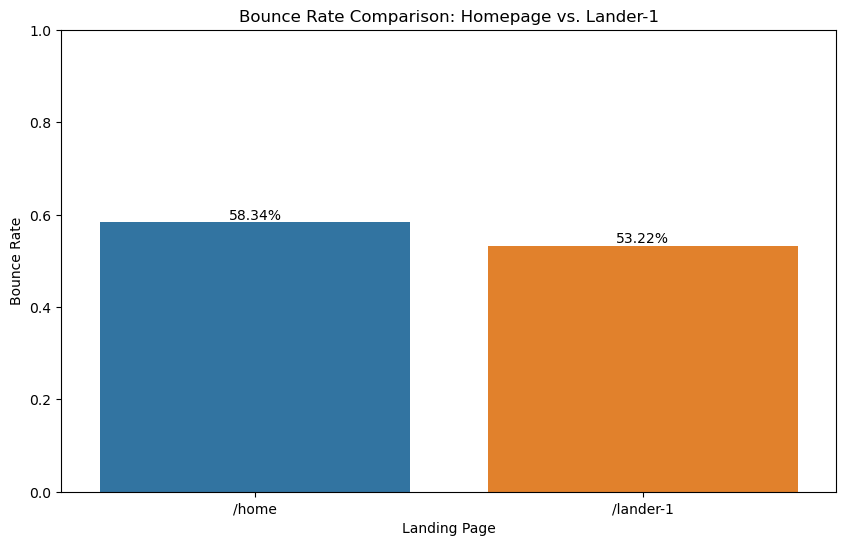

In [92]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.barplot(
    x='pageview_url',
    y='bounce_rate',
    data=results.reset_index(),
    palette=['#1f77b4', '#ff7f0e']
)

plt.title('Bounce Rate Comparison: Homepage vs. Lander-1')
plt.xlabel('Landing Page')
plt.ylabel('Bounce Rate')
plt.ylim(0, 1)

# Add value labels
for index, row in results.reset_index().iterrows():
    plt.text(index, row['bounce_rate'], f"{row['bounce_rate']:.2%}", 
             ha='center', va='bottom')

plt.show()

Findings:
 
Great news! The study shows that the new landing page (/lander-1) has fewer people leaving without clicking on anything else compared to the homepage (/home) in our test. This means the new page is doing a good job at keeping people interested and on our site. So, it looks like the new landing page is a hit!


# LANDING PAGE TREND ANALYSIS

*August 31, 2012*

Can you look at how many people visited the /home and /lander-1 pages each week from paid non-brand searches since June 1st? I want to make sure people are going to the right pages. Also, can you show me how the bounce rate for all paid searches has changed each week? I want to see if changing the landing page has helped us do better overall. 


In [96]:
# Convert to datetime
website_pageviews['created_at'] = pd.to_datetime(website_pageviews['created_at'])
website_sessions['created_at'] = pd.to_datetime(website_sessions['created_at'])

# Rename to avoid column name conflict after merge
website_sessions = website_sessions.rename(columns={'created_at': 'session_created_at'})

# Merge DataFrames
merged = pd.merge(
    website_pageviews, 
    website_sessions[['website_session_id', 'utm_source', 'utm_campaign', 'session_created_at']],
    on='website_session_id',
    how='left'
)

# Filter for date range and campaign
mask = (
    (merged['session_created_at'] >= '2012-06-01') & 
    (merged['session_created_at'] <= '2012-08-31') &
    (merged['utm_source'] == 'gsearch') &
    (merged['utm_campaign'] == 'nonbrand')
)

filtered_data = merged[mask].copy()


### Identify Landing Pages

In [98]:
# Get first pageview per session
first_pageviews = filtered_data.groupby('website_session_id').agg({
    'website_pageview_id': 'min',
    'created_at': 'first'
}).reset_index()

# Merge to get landing page URLs
landing_pages = pd.merge(
    first_pageviews,
    filtered_data[['website_pageview_id', 'pageview_url']],
    on='website_pageview_id',
    how='left'
)

### Count Pageviews per Session

In [100]:
# Calculate total pages viewed per session
pageview_counts = filtered_data.groupby('website_session_id').size().reset_index(name='pageview_count')

# Combine with landing pages
final_data = pd.merge(
    landing_pages,
    pageview_counts,
    on='website_session_id'
)

### Weekly Aggregation

In [102]:
# Extract week start date (Monday)
final_data['week_start'] = final_data['created_at'].dt.to_period('W').dt.start_time

# Calculate metrics
weekly_stats = final_data.groupby('week_start').agg(
    total_sessions=('website_session_id', 'nunique'),
    bounced_sessions=('pageview_count', lambda x: sum(x == 1)),
    home_sessions=('pageview_url', lambda x: sum(x == '/home')),
    lander1_sessions=('pageview_url', lambda x: sum(x == '/lander-1'))
).reset_index()

weekly_stats['bounce_rate'] = weekly_stats['bounced_sessions'] / weekly_stats['total_sessions']

NameError: name 'PercentFormatter' is not defined

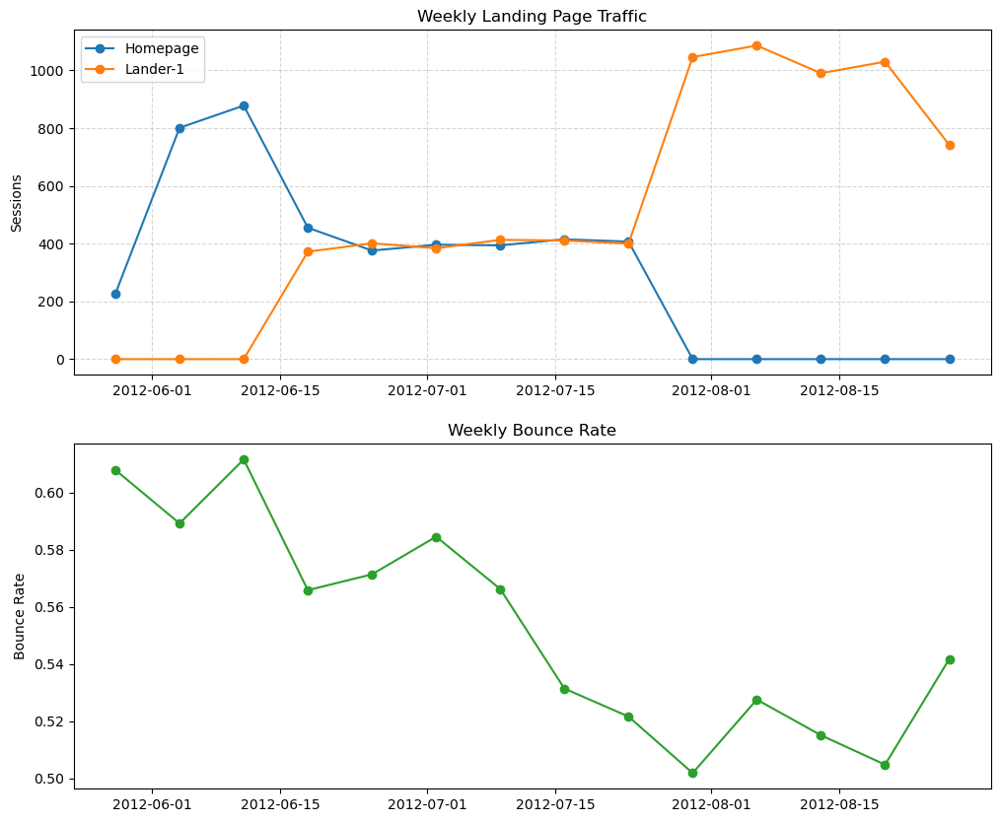

In [103]:
plt.figure(figsize=(12, 10))

# Plot 1: Landing Page Traffic
plt.subplot(2, 1, 1)
plt.plot(weekly_stats['week_start'], weekly_stats['home_sessions'], 
         label='Homepage', marker='o', color='#1f77b4')
plt.plot(weekly_stats['week_start'], weekly_stats['lander1_sessions'], 
         label='Lander-1', marker='o', color='#ff7f0e')
plt.title('Weekly Landing Page Traffic')
plt.ylabel('Sessions')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)

# Plot 2: Bounce Rate
plt.subplot(2, 1, 2)
plt.plot(weekly_stats['week_start'], weekly_stats['bounce_rate'], 
         marker='o', color='#2ca02c')
plt.title('Weekly Bounce Rate')
plt.ylabel('Bounce Rate')
plt.gca().yaxis.set_major_formatter(PercentFormatter(1))  # Format as %
plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

In [156]:
# Format and display
result_table = weekly_stats[['week_start', 'home_sessions', 'lander1_sessions', 'bounce_rate']].copy()
result_table['week_start'] = result_table['week_start'].dt.strftime('%Y-%m-%d')
result_table['bounce_rate'] = result_table['bounce_rate'].apply(lambda x: f"{x:.1%}")

print("\nWeekly Performance Summary:")
display(result_table)


Weekly Performance Summary:


,week_start,home_sessions,lander1_sessions,bounce_rate
0,2012-05-28,227,0,60.8%
1,2012-06-04,801,0,58.9%
2,2012-06-11,878,0,61.2%
3,2012-06-18,455,372,56.6%
4,2012-06-25,376,401,57.1%
5,2012-07-02,396,384,58.5%
6,2012-07-09,394,413,56.6%
7,2012-07-16,415,411,53.1%
8,2012-07-23,407,400,52.2%
9,2012-07-30,0,1046,50.2%


Findings:
 

The study shows that at first, both the /home and /lander-1 pages were getting visitors. But then, as we planned, all the visitors started going to the new landing page (/lander-1). Also, we’re seeing a good trend where fewer people are leaving our site without clicking on anything else over time. So, it looks like our changes are working!


#### What is Landing Page Trend Analysis?

Conversion funnel analysis is like figuring out and improving each step a user takes before they buy your products. This includes:

**1.	Finding Common Paths:** Understanding the usual steps customers take before they make a purchase.

**2.	Tracking User Progress:** Keeping an eye on how many users move forward at each step in your sales process.

**3.	Spotting Drop-Off Points:** Noticing where users usually stop and leave the process.
By making these drop-off points better, we aim to get more users to complete the process and increase our product sales.
 
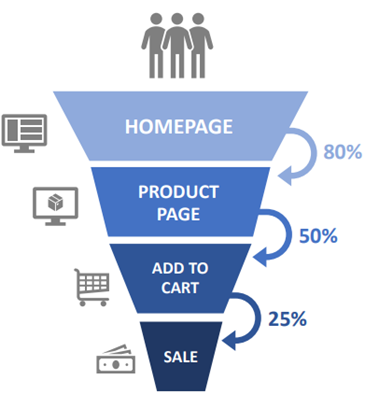
**Example:-** When we perform conversion funnel analysis, we will look at each step in our conversion flow to see how many customers drop off and how many continue on at each step.

**Query:** SELECT * FROM website_pageviews WHERE website_session_id = 1059
 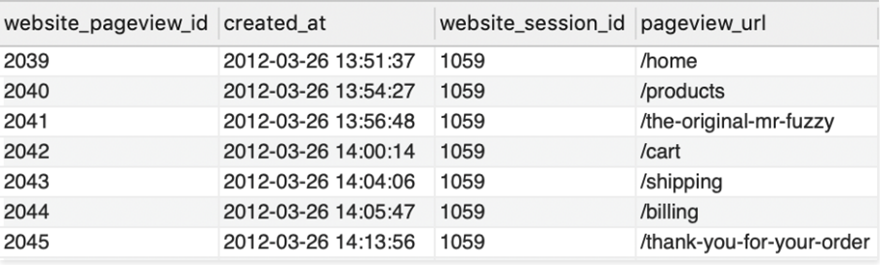



# BUILDING CONVERSION FUNNELS

*September 05, 2012*

Can you make a map that shows the steps our gsearch visitors take from the time they land on our new /lander-1 page until they place an order? I want to see where we’re losing people at each step. Start the map from the /lander-1 page and end at our thank you page, and use data from August 5th onwards. Does that make sense?



### Filter Relevant Sessions

In [163]:
import pandas as pd

# Step 1: Convert date columns to datetime
# Check correct column names before conversion
website_sessions['session_created_at'] = pd.to_datetime(website_sessions['session_created_at'])
website_pageviews['created_at'] = pd.to_datetime(website_pageviews['created_at'])

# Step 2: Filter relevant sessions (gsearch, nonbrand, date range)
gsearch_nonbrand = website_sessions[
    (website_sessions['utm_source'] == 'gsearch') &
    (website_sessions['utm_campaign'] == 'nonbrand') &
    (website_sessions['session_created_at'] >= '2012-08-05') &
    (website_sessions['session_created_at'] <= '2012-09-05')
]


### Get all pageviews for these sessions

In [166]:
funnel_data = pd.merge(
    gsearch_nonbrand[['website_session_id']],
    website_pageviews[['website_session_id', 'pageview_url', 'created_at']],
    on='website_session_id',
    how='left'
).sort_values(['website_session_id', 'created_at'])

### Identify sessions that started with /lander-1

In [169]:
first_pageviews = funnel_data.drop_duplicates('website_session_id', keep='first')
lander1_sessions = first_pageviews[first_pageviews['pageview_url'] == '/lander-1']['website_session_id']
funnel_data = funnel_data[funnel_data['website_session_id'].isin(lander1_sessions)]

### Create conversion flags for each step

In [172]:
funnel_steps = [
    '/lander-1',
    '/products',
    '/the-original-mr-fuzzy',
    '/cart',
    '/shipping',
    '/billing',
    '/thank-you-for-your-order'
]

# Create flags for each step
for i, step in enumerate(funnel_steps):
    funnel_data[f'step_{i}'] = (funnel_data['pageview_url'] == step).astype(int)

### Create session-level summary

In [175]:
session_summary = funnel_data.groupby('website_session_id').agg({
    'step_0': 'max',  # lander-1
    'step_1': 'max',  # products
    'step_2': 'max',  # mr fuzzy
    'step_3': 'max',  # cart
    'step_4': 'max',  # shipping
    'step_5': 'max',  # billing
    'step_6': 'max'   # thank you
})

### Calculate funnel metrics

In [178]:
funnel_counts = {
    'Lander-1': session_summary['step_0'].sum(),
    'Products': session_summary['step_1'].sum(),
    'Mr. Fuzzy': session_summary['step_2'].sum(),
    'Cart': session_summary['step_3'].sum(),
    'Shipping': session_summary['step_4'].sum(),
    'Billing': session_summary['step_5'].sum(),
    'Thank You': session_summary['step_6'].sum()
}

# Calculate conversion rates between steps
conversion_rates = {
    'Lander→Products': funnel_counts['Products'] / funnel_counts['Lander-1'],
    'Products→MrFuzzy': funnel_counts['Mr. Fuzzy'] / funnel_counts['Products'],
    'MrFuzzy→Cart': funnel_counts['Cart'] / funnel_counts['Mr. Fuzzy'],
    'Cart→Shipping': funnel_counts['Shipping'] / funnel_counts['Cart'],
    'Shipping→Billing': funnel_counts['Billing'] / funnel_counts['Shipping'],
    'Billing→ThankYou': funnel_counts['Thank You'] / funnel_counts['Billing']
}

C:\Users\SAGNIK\AppData\Local\Temp\ipykernel_9936\2792426299.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=funnel_df.index, y='Count', data=funnel_df, palette='viridis')


NameError: name 'PercentFormatter' is not defined

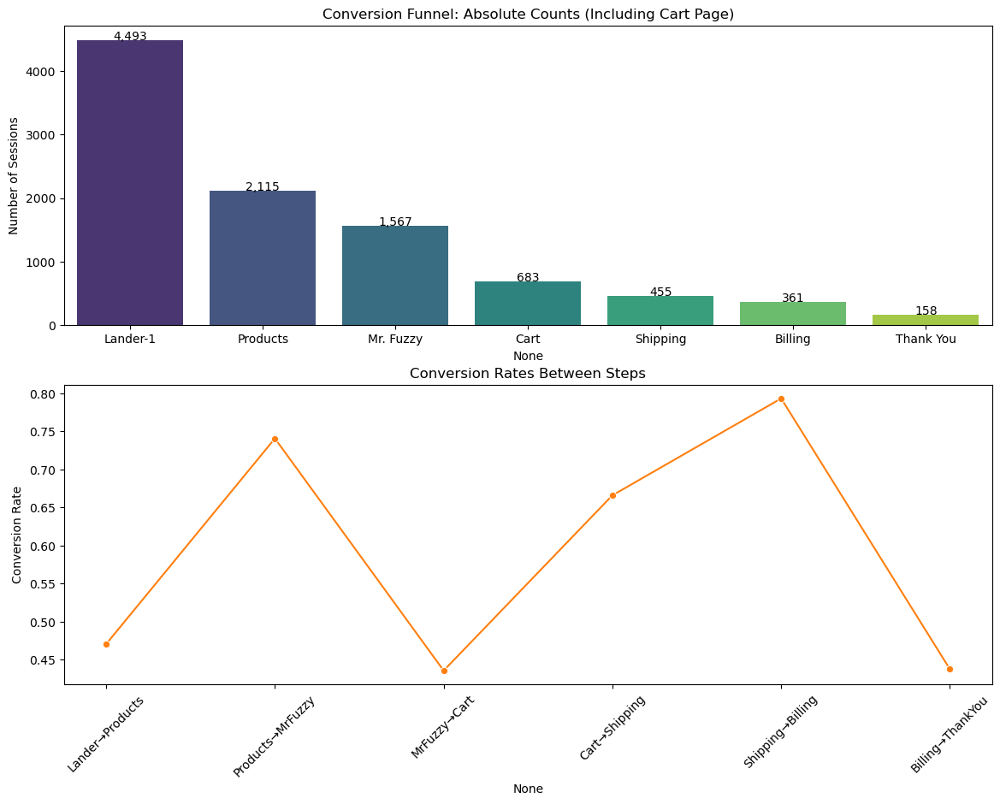

In [180]:
plt.figure(figsize=(14, 10))

# Funnel Counts Plot
plt.subplot(2, 1, 1)
funnel_df = pd.DataFrame.from_dict(funnel_counts, orient='index', columns=['Count'])
sns.barplot(x=funnel_df.index, y='Count', data=funnel_df, palette='viridis')
plt.title('Conversion Funnel: Absolute Counts (Including Cart Page)')
plt.ylabel('Number of Sessions')
plt.xticks(rotation=0)
for i, count in enumerate(funnel_counts.values()):
    plt.text(i, count+5, f"{count:,}", ha='center')

# Conversion Rates Plot
plt.subplot(2, 1, 2)
rates_df = pd.DataFrame.from_dict(conversion_rates, orient='index', columns=['Rate'])
sns.lineplot(x=rates_df.index, y='Rate', data=rates_df, marker='o', color='#ff7f0e')
plt.title('Conversion Rates Between Steps')
plt.ylabel('Conversion Rate')
plt.xticks(rotation=45)
plt.gca().yaxis.set_major_formatter(PercentFormatter(1))
plt.ylim(0, 1)
for i, rate in enumerate(conversion_rates.values()):
    plt.text(i, rate+0.02, f"{rate:.1%}", ha='center')

plt.tight_layout()
plt.show()

In [182]:
metrics_table = pd.DataFrame({
    'Funnel Step': list(funnel_counts.keys()),
    'Sessions': list(funnel_counts.values()),
    'Next Step': list(conversion_rates.keys()) + ['-'],
    'Conversion Rate': list(conversion_rates.values()) + [None]
})

print("\nComplete Funnel Analysis (Including Cart Page):")
display(metrics_table.style.format({
    'Sessions': '{:,}',
    'Conversion Rate': '{:.1%}'
}).set_properties(**{'text-align': 'left'}))


Complete Funnel Analysis (Including Cart Page):


,Funnel Step,Sessions,Next Step,Conversion Rate
0,Lander-1,"4,493",Lander→Products,47.1%
1,Products,"2,115",Products→MrFuzzy,74.1%
2,Mr. Fuzzy,"1,567",MrFuzzy→Cart,43.6%
3,Cart,683,Cart→Shipping,66.6%
4,Shipping,455,Shipping→Billing,79.3%
5,Billing,361,Billing→ThankYou,43.8%
6,Thank You,158,-,nan%


Findings: 
 

The study shows that we should focus on making the /lander-1, Mr. Fuzzy page, and the billing page better because they’re not getting a lot of clicks. In particular, we could make the billing page more user-friendly for customers when they’re entering their credit card details. I have some ideas for changes that could make this better and might help more people complete their purchases on the billing page.


# ANALYZING CONVERSION FUNNEL TESTS

*November 10, 2012*

Can you check if the new /billing-2 page is doing better than the old /billing page, based on our earlier study? Specifically, can you find out what portion of visits to these pages end up with an order being placed? Keep in mind, this test was done for all visitors, not just those coming from search. Does that make sense?


### Determine When /billing-2 Was First Used

In [188]:
# Load data
pageviews = pd.read_csv('website_pageviews.csv')
orders = pd.read_csv('orders.csv')

# Convert to datetime
pageviews['created_at'] = pd.to_datetime(pageviews['created_at'])

# Find when billing-2 was first launched (for reference)
billing2_start = pageviews[pageviews['pageview_url'] == '/billing-2'].agg({
    'created_at': 'min',
    'website_pageview_id': 'min'
})
print(f"Billing-2 test started on {billing2_start['created_at'].date()} (Pageview ID: {billing2_start['website_pageview_id']})")

Billing-2 test started on 2012-09-10 (Pageview ID: 53550)


### Filter Relevant Sessions

In [190]:
# Filter for billing pageviews after test started
billing_pages = pageviews[
    (pageviews['created_at'] < '2012-11-10') &
    (pageviews['website_pageview_id'] >= 53350) &
    (pageviews['pageview_url'].isin(['/billing', '/billing-2']))
]

# Merge with orders data
billing_data = pd.merge(
    billing_pages,
    orders[['website_session_id', 'order_id']],
    on='website_session_id',
    how='left'
)

### Calculate Conversion Rates

In [194]:
# Group by billing page version
results = billing_data.groupby('pageview_url').agg(
    sessions=('website_session_id', 'nunique'),
    orders=('order_id', 'count')
).reset_index()

# Calculate conversion rate
results['conversion_rate'] = results['orders'] / results['sessions']

### Statistical Significance Test

C:\Users\SAGNIK\AppData\Local\Temp\ipykernel_9936\2586333970.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


TypeError: '<' not supported between instances of 'Rectangle' and 'float'

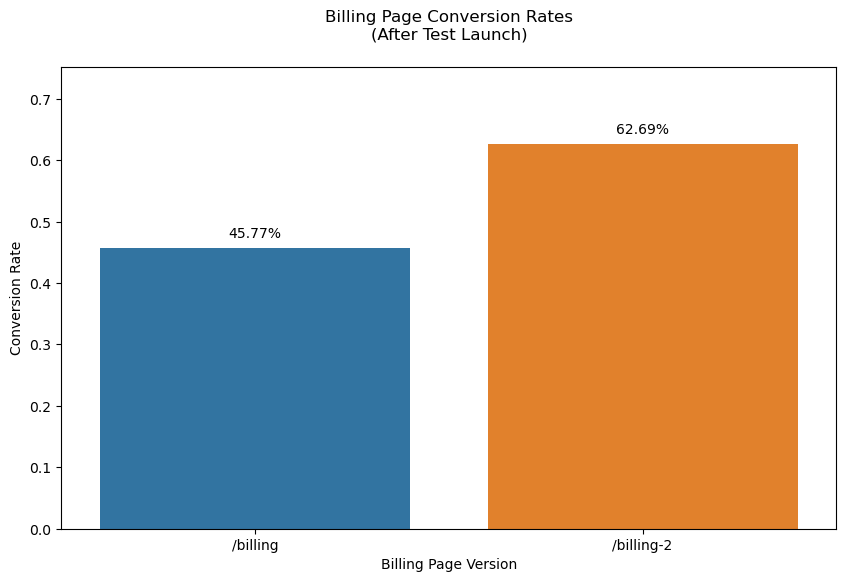

In [197]:
plt.figure(figsize=(10, 6))
ax = sns.barplot(
    x='pageview_url',
    y='conversion_rate',
    data=results,
    palette=['#1f77b4', '#ff7f0e']  # Blue for original, orange for new
)

plt.title('Billing Page Conversion Rates\n(After Test Launch)', pad=20)
plt.xlabel('Billing Page Version')
plt.ylabel('Conversion Rate')
plt.ylim(0, results['conversion_rate'].max() * 1.2)

# Add value labels
for p in ax.patches:
    ax.annotate(f"{p.get_height():.2%}", 
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 10),
                textcoords='offset points')

# Add significance marker if p < 0.05
if p < 0.05:
    plt.text(0.5, results['conversion_rate'].max() * 1.1, 
             "*** Statistically Significant Difference ***", 
             ha='center', color='red')

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [199]:
print("\nBilling Page Performance Comparison:")
display(results.style.format({
    'sessions': '{:,}',
    'orders': '{:,}',
    'conversion_rate': '{:.2%}'
}).hide(axis='index'))


Billing Page Performance Comparison:


pageview_url,sessions,orders,conversion_rate
/billing,662,303,45.77%
/billing-2,654,410,62.69%


Findings: 
 
The new billing page, /billing-2, is doing a great job at getting more customers to buy. Because it’s working so well, we’ve decided to start using this new page for all our customers right away. I’ll work with the Engineering team to make this change as soon as possible.


### ANALYSIS FOR CHANNEL MANAGEMENT

#### What Is Channel Portfolio Optimization?

Analyzing a portfolio of marketing channels is like figuring out the best way to use your advertising budget. You want to spend your money wisely and use data to make your ads more effective. This includes:

**1.	Finding the Best Channels:** Figuring out which advertising channels bring the most visitors and orders to your website.
**2.	Understanding User Differences:** Learning about how users from different channels behave and how often they end up buying something.
**3.	Optimizing Bids and Spending:** Adjusting how much you’re willing to pay for ads and deciding how to split your budget across different channels.
 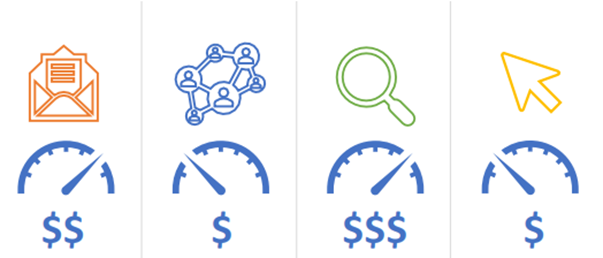

#### Common use cases: 
• Understanding which marketing channels are driving the most sessions and orders through your website 

• Understanding differences in user characteristics and conversion performance across marketing channels

• Optimizing bids and allocating marketing spend across a multi-channel portfolio to achieve maximum performance


#### TRACKING PARAMETERS USED: 

When companies pay for marketing campaigns, they usually keep a close eye on how well they’re doing. They check everything, like how much money they’re spending and how often people who visit their site end up buying something.
Paid traffic, or visitors that come from paid ads, often have special tracking tags called UTM parameters added to the URLs they click on. These tags help us understand which ads or campaigns the visitors came from. This way, we can connect what people do on the website back to the specific ads or campaigns they came from.

### Example:
SELECT DISTINCT utm_source, utm_campaign FROM website_sessions

 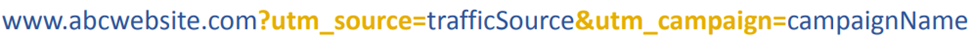
 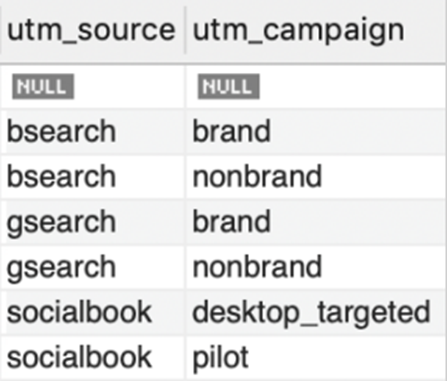

 


# ANALYZING CHANNEL PORTFOLIOS

*November 29, 2012*

Can you show me how many people visited our site each week from the new bsearch paid search channel since it started around August 22nd? Also, can you compare this with the weekly number of visitors from the gsearch nonbrand channel? I want to understand how important bsearch is for our business compared to the successful gsearch. Does that make sense?


In [205]:
sessions = pd.read_csv('website_sessions.csv')

# Convert to datetime and filter date range
sessions['created_at'] = pd.to_datetime(sessions['created_at'])
analysis_period = sessions[
    (sessions['created_at'] >= '2012-08-22') & 
    (sessions['created_at'] <= '2012-11-29') &
    (sessions['utm_campaign'] == 'nonbrand') &
    (sessions['utm_source'].isin(['gsearch', 'bsearch']))
]

### Extract week start date (Monday)

In [208]:
analysis_period['week_start'] = analysis_period['created_at'].dt.to_period('W').dt.start_time

C:\Users\SAGNIK\AppData\Local\Temp\ipykernel_9936\1004120010.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  analysis_period['week_start'] = analysis_period['created_at'].dt.to_period('W').dt.start_time


### Aggregate weekly sessions by source

In [211]:
weekly_stats = analysis_period.groupby(['week_start', 'utm_source'])['website_session_id'] \
    .nunique() \
    .unstack() \
    .fillna(0)

# Calculate weekly totals
weekly_stats['total_sessions'] = weekly_stats.sum(axis=1)
weekly_stats = weekly_stats[['gsearch', 'bsearch', 'total_sessions']]

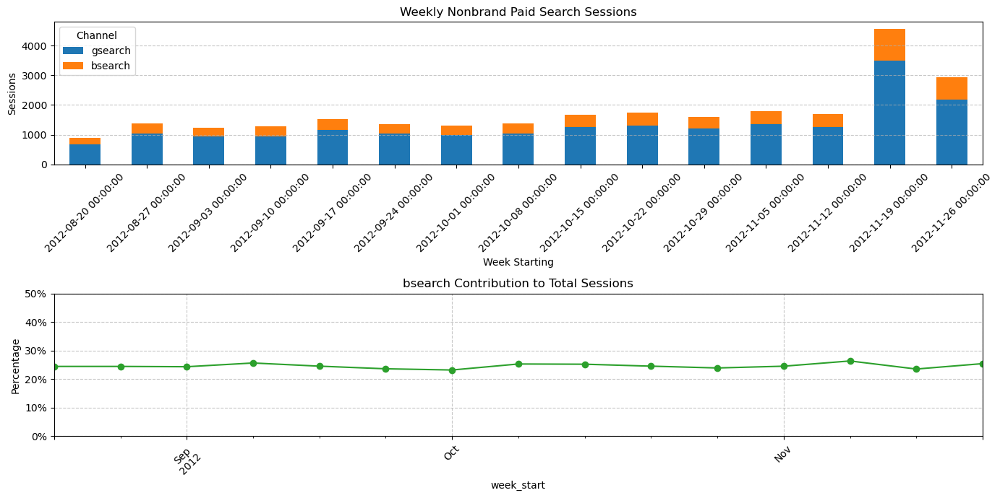

In [213]:
from matplotlib.ticker import FuncFormatter
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 7))

# Bar plot for absolute numbers
plt.subplot(2, 1, 1)
weekly_stats[['gsearch', 'bsearch']].plot(kind='bar', stacked=True, 
                                          color=['#1f77b4', '#ff7f0e'], 
                                          ax=plt.gca())
plt.title('Weekly Nonbrand Paid Search Sessions')
plt.ylabel('Sessions')
plt.xlabel('Week Starting')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(title='Channel')

# Line plot for percentage contribution
plt.subplot(2, 1, 2)
(weekly_stats['bsearch'] / weekly_stats['total_sessions']).plot(
    kind='line', marker='o', color='#2ca02c')
plt.title('bsearch Contribution to Total Sessions')
plt.ylabel('Percentage')
plt.gca().yaxis.set_major_formatter(FuncFormatter(lambda y, _: f"{y:.0%}")) 
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.7)
plt.ylim(0, 0.5)

# Add vertical spacing between plots
plt.subplots_adjust(hspace=0.4)

plt.tight_layout()
plt.show()


In [214]:
print("Weekly Session Counts:")
display(weekly_stats.style.format({
    'gsearch': '{:,}',
    'bsearch': '{:,}',
    'total_sessions': '{:,}'
}))

Weekly Session Counts:


utm_source,gsearch,bsearch,total_sessions
week_start,,,
2012-08-20 00:00:00,681,220,901
2012-08-27 00:00:00,"1,040",336,"1,376"
2012-09-03 00:00:00,937,301,"1,238"
2012-09-10 00:00:00,952,328,"1,280"
2012-09-17 00:00:00,"1,158",376,"1,534"
2012-09-24 00:00:00,"1,030",318,"1,348"
2012-10-01 00:00:00,995,300,"1,295"
2012-10-08 00:00:00,"1,029",348,"1,377"
2012-10-15 00:00:00,"1,250",421,"1,671"


In [217]:
# Calculate overall stats
total_stats = pd.DataFrame({
    'Channel': ['gsearch', 'bsearch', 'Total'],
    'Sessions': [weekly_stats['gsearch'].sum(), 
                 weekly_stats['bsearch'].sum(), 
                 weekly_stats['total_sessions'].sum()],
    'Avg_Weekly': [weekly_stats['gsearch'].mean(), 
                   weekly_stats['bsearch'].mean(), 
                   weekly_stats['total_sessions'].mean()],
    'Pct_Total': [weekly_stats['gsearch'].sum()/weekly_stats['total_sessions'].sum(),
                  weekly_stats['bsearch'].sum()/weekly_stats['total_sessions'].sum(),
                  1]
})

print("\nOverall Performance Summary:")
display(total_stats.style.format({
    'Sessions': '{:,}',
    'Avg_Weekly': '{:,.0f}',
    'Pct_Total': '{:.1%}'
}))


Overall Performance Summary:


,Channel,Sessions,Avg_Weekly,Pct_Total
0,gsearch,"19,884","1,326",75.5%
1,bsearch,"6,460",431,24.5%
2,Total,"26,344","1,756",100.0%


Findings:

 

The study shows that bsearch gets about one-third of the visitors that gsearch does. This big difference tells us that we need to learn more about how bsearch works, because it could really affect our business.


# COMPARING CHANNEL CHARACTERISTICS

*November 30, 2012*

Can you tell me about the bsearch campaign that isn’t tied to a brand? I’m interested in knowing what portion of its traffic comes from mobile devices since it started around August 22nd. Also, could you compare this with the percentage of mobile traffic for gsearch? If you find anything else interesting, feel free to share. Just the overall data since August 22nd is enough; we don’t need to look at how it’s changed over time right now.


In [222]:
sessions = pd.read_csv('website_sessions.csv')

# Filter for date range and nonbrand campaigns
analysis_period = sessions[
    (sessions['created_at'] >= '2012-08-22') & 
    (sessions['created_at'] <= '2012-11-30') &
    (sessions['utm_campaign'] == 'nonbrand') &
    (sessions['utm_source'].isin(['gsearch', 'bsearch']))
]


### Calculate device distribution

In [225]:
device_stats = analysis_period.groupby('utm_source').agg(
    total_sessions=('website_session_id', 'nunique'),
    mobile_sessions=('device_type', lambda x: sum(x == 'mobile')),
    desktop_sessions=('device_type', lambda x: sum(x == 'desktop'))
).reset_index()

# Calculate percentages
device_stats['mobile_pct'] = device_stats['mobile_sessions'] / device_stats['total_sessions']
device_stats['desktop_pct'] = device_stats['desktop_sessions'] / device_stats['total_sessions']

NameError: name 'PercentFormatter' is not defined

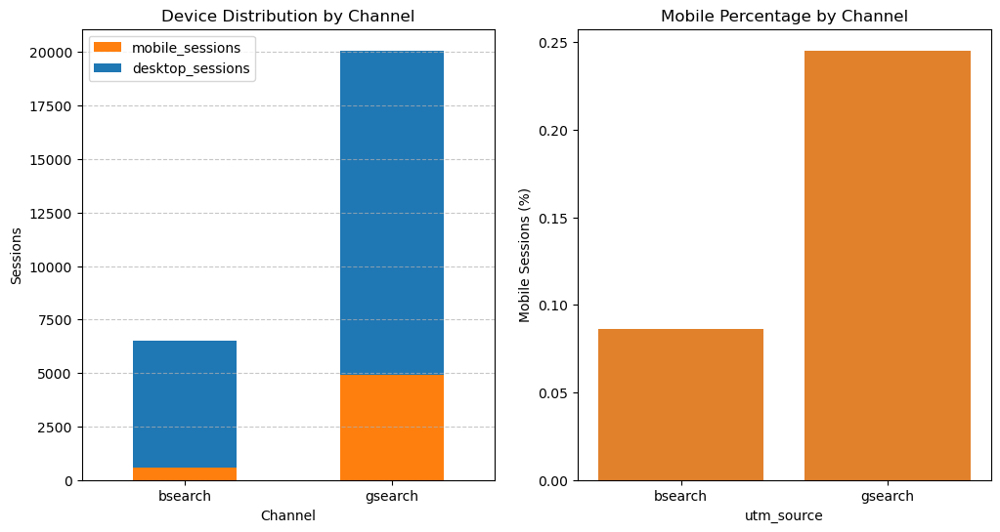

In [227]:
plt.figure(figsize=(12, 6))

# Stacked bar chart
ax1 = plt.subplot(1, 2, 1)
device_stats.set_index('utm_source')[['mobile_sessions', 'desktop_sessions']].plot(
    kind='bar', stacked=True, color=['#ff7f0e', '#1f77b4'], ax=ax1)
plt.title('Device Distribution by Channel')
plt.ylabel('Sessions')
plt.xlabel('Channel')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Percentage comparison
ax2 = plt.subplot(1, 2, 2)
sns.barplot(x='utm_source', y='mobile_pct', data=device_stats, color='#ff7f0e')
plt.title('Mobile Percentage by Channel')
plt.ylabel('Mobile Sessions (%)')
plt.gca().yaxis.set_major_formatter(PercentFormatter(1))
plt.ylim(0, 0.5)
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

## Output Table
print("Device Distribution Summary:")
display(device_stats.style.format({
    'total_sessions': '{:,}',
    'mobile_sessions': '{:,}',
    'desktop_sessions': '{:,}',
    'mobile_pct': '{:.1%}',
    'desktop_pct': '{:.1%}'
}))

### Conversion rates by device/channel (if order data available)``

In [230]:
try:
    orders = pd.read_csv('orders.csv')
    merged_data = pd.merge(
        analysis_period,
        orders[['website_session_id', 'order_id']],
        on='website_session_id',
        how='left'
    )
    conv_rates = merged_data.groupby(['utm_source', 'device_type']).agg(
        sessions=('website_session_id', 'nunique'),
        orders=('order_id', 'count')
    ).reset_index()
    conv_rates['conversion_rate'] = conv_rates['orders'] / conv_rates['sessions']
    
    print("\nConversion Rates by Channel/Device:")
    display(conv_rates.style.format({
        'sessions': '{:,}',
        'orders': '{:,}',
        'conversion_rate': '{:.2%}'
    }))
except:
    print("\n(Order data not available for conversion rate analysis)")


Conversion Rates by Channel/Device:


,utm_source,device_type,sessions,orders,conversion_rate
0,bsearch,desktop,"5,960",303,5.08%
1,bsearch,mobile,562,5,0.89%
2,gsearch,desktop,"15,152",750,4.95%
3,gsearch,mobile,"4,921",77,1.56%


Findings:
 
Looking at the data for desktop and mobile users, we see some interesting differences between bsearch and gsearch, especially when it comes to what devices people are using. This tells us that these two channels are quite different in terms of device use. As we move forward, it’s important to remember this as we keep learning and making improvements, recognizing that these channels are not the same.


# CHANNEL PORTFOLIO TRENDS

*December 22, 2012*

Can you find out how many sessions we’ve had each week for gsearch and bsearch that weren’t tied to a brand, broken down by device type, starting from November 4th? It would also be good to see how bsearch compares to gsearch in terms of percentage for each device. This will help us understand the effect of reducing our bid for bsearch nonbrand on December 2nd.


### Generate Website Sessions Data

In [236]:
# Load your data
website_sessions = pd.read_csv("website_sessions.csv")
orders = pd.read_csv("orders.csv")

# Convert 'created_at' columns to datetime
website_sessions['created_at'] = pd.to_datetime(website_sessions['created_at'])
orders['created_at'] = pd.to_datetime(orders['created_at'])

# Filter nonbrand sessions in the given date range
nonbrand_sessions = website_sessions[
    (website_sessions['created_at'] >= '2012-11-04') &
    (website_sessions['created_at'] <= '2012-12-22') &
    (website_sessions['utm_campaign'] == 'nonbrand')
].copy()


### Extract Year-Week for Grouping

In [239]:
nonbrand_sessions['year_week'] = nonbrand_sessions['created_at'].dt.strftime('%Y-%U')

### Group by Week & Calculate Metrics

In [242]:
weekly_trends = nonbrand_sessions.groupby('year_week').agg(
    min_start_date=('created_at', 'min'),

    # Desktop Sessions
    g_desktop_sessions=pd.NamedAgg(
        column='website_session_id',
        aggfunc=lambda x: ((nonbrand_sessions.loc[x.index, 'utm_source'] == 'gsearch') & 
                           (nonbrand_sessions.loc[x.index, 'device_type'] == 'desktop')).sum()
    ),
    b_desktop_sessions=pd.NamedAgg(
        column='website_session_id',
        aggfunc=lambda x: ((nonbrand_sessions.loc[x.index, 'utm_source'] == 'bsearch') & 
                           (nonbrand_sessions.loc[x.index, 'device_type'] == 'desktop')).sum()
    ),

    # Mobile Sessions
    g_mobile_sessions=pd.NamedAgg(
        column='website_session_id',
        aggfunc=lambda x: ((nonbrand_sessions.loc[x.index, 'utm_source'] == 'gsearch') & 
                           (nonbrand_sessions.loc[x.index, 'device_type'] == 'mobile')).sum()
    ),
    b_mobile_sessions=pd.NamedAgg(
        column='website_session_id',
        aggfunc=lambda x: ((nonbrand_sessions.loc[x.index, 'utm_source'] == 'bsearch') & 
                           (nonbrand_sessions.loc[x.index, 'device_type'] == 'mobile')).sum()
    )
).reset_index()

# Calculate bsearch as % of gsearch
weekly_trends['b_pct_of_g_desktop'] = weekly_trends['b_desktop_sessions'] / weekly_trends['g_desktop_sessions']
weekly_trends['b_pct_of_g_mobile'] = weekly_trends['b_mobile_sessions'] / weekly_trends['g_mobile_sessions']


NameError: name 'datetime' is not defined

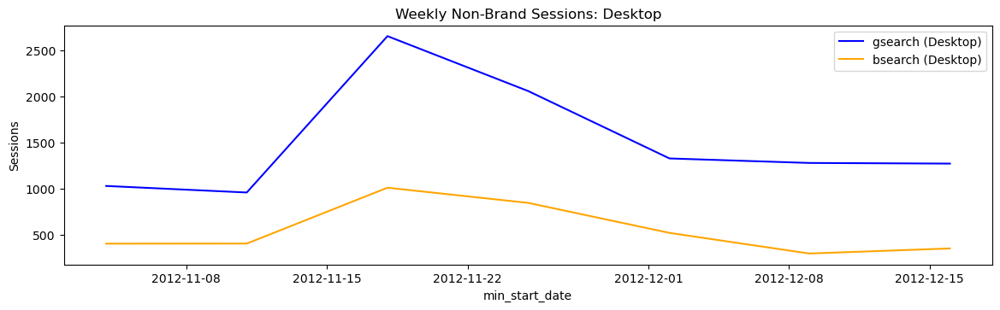

In [244]:
plt.figure(figsize=(14, 8))

# Plot Desktop Sessions
plt.subplot(2, 1, 1)
sns.lineplot(
    x='min_start_date',
    y='g_desktop_sessions',
    data=weekly_trends,
    label='gsearch (Desktop)',
    color='blue'
)
sns.lineplot(
    x='min_start_date',
    y='b_desktop_sessions',
    data=weekly_trends,
    label='bsearch (Desktop)',
    color='orange'
)
plt.title('Weekly Non-Brand Sessions: Desktop')
plt.ylabel('Sessions')
plt.axvline(datetime(2012, 12, 2), color='red', linestyle='--', label='Bid Reduction (Dec 2)')
plt.legend()

# Plot Mobile Sessions
plt.subplot(2, 1, 2)
sns.lineplot(
    x='min_start_date',
    y='g_mobile_sessions',
    data=weekly_trends,
    label='gsearch (Mobile)',
    color='blue'
)
sns.lineplot(
    x='min_start_date',
    y='b_mobile_sessions',
    data=weekly_trends,
    label='bsearch (Mobile)',
    color='orange'
)
plt.title('Weekly Non-Brand Sessions: Mobile')
plt.ylabel('Sessions')
plt.axvline(datetime(2012, 12, 2), color='red', linestyle='--', label='Bid Reduction (Dec 2)')
plt.legend()

plt.tight_layout()
plt.show()

NameError: name 'datetime' is not defined

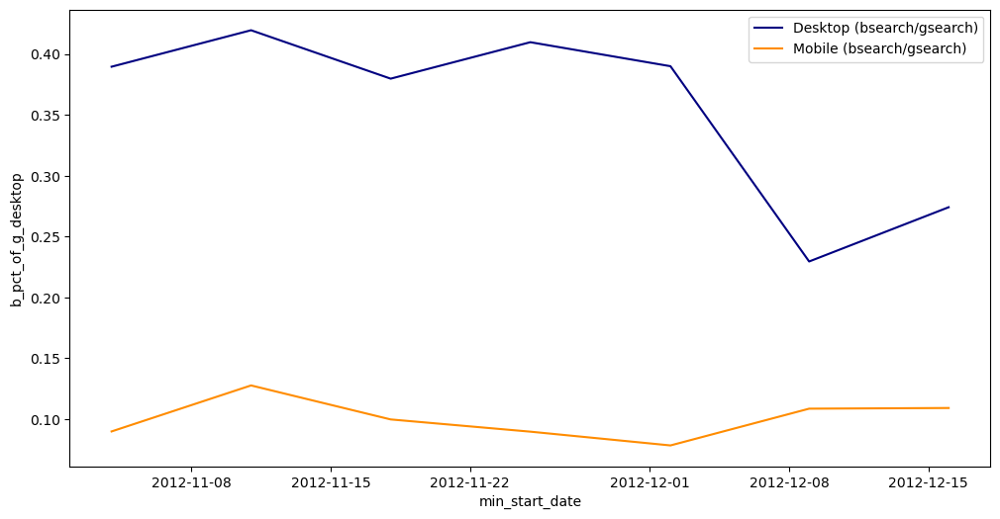

In [246]:
plt.figure(figsize=(12, 6))
sns.lineplot(
    x='min_start_date',
    y='b_pct_of_g_desktop',
    data=weekly_trends,
    label='Desktop (bsearch/gsearch)',
    color='navy'
)
sns.lineplot(
    x='min_start_date',
    y='b_pct_of_g_mobile',
    data=weekly_trends,
    label='Mobile (bsearch/gsearch)',
    color='darkorange'
)
plt.axvline(datetime(2012, 12, 2), color='red', linestyle='--', label='Bid Reduction (Dec 2)')
plt.title('Bsearch as % of Gsearch (Weekly Trend)')
plt.ylabel('Percentage')
plt.legend()
plt.show()

Findings:
 

The numbers show that after we lowered our bid, fewer people came to us through bsearch. Interestingly, we also saw fewer people coming through gsearch after Black Friday and Cyber Monday, but not as many fewer. This seems okay, especially since bsearch wasn’t converting as many visitors to buyers.


#### What is analyzing direct traffic?
Looking at how many people come to your site directly or through your brand is really important for understanding how well your brand is doing and how it’s affecting your business. This includes looking at how much money you’re making from people who come to your site directly, which usually means you’re making a good profit without having to spend money to get customers. It also involves seeing if paying for traffic leads to a “halo” effect, where it brings in more direct traffic. This kind of analysis is key for seeing how different strategies are affecting how many customers are actively looking for your business.
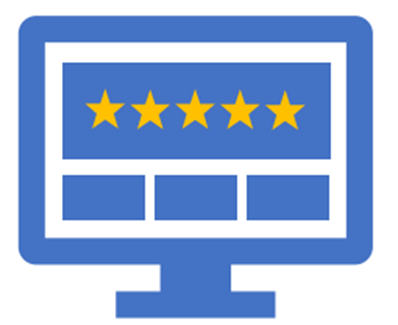
 
#### COMMON USE CASES: 
• Figuring out how much money you’re making from people who come to your site directly - this is profit that you don’t have to spend money to get 

• Seeing if the traffic you’re paying for is creating a “halo” effect, and bringing in more people who come directly to your site 

• Checking how different strategies are affecting how many customers are actively looking for your business


# ANALYZING FREE CHANNELS

*December 23, 2012*

Can you give me a monthly breakdown of how many people are finding our site through organic search, typing in our URL directly, and searching for our brand? Also, could you show these numbers as a percentage of the sessions from non-brand paid search? This will help answer an investor’s question about whether our brand is gaining traction or if we’re still mostly depending on paid traffic.


### Data Preparation

In [253]:
# Generate date range
date_range = pd.date_range(start='2012-01-01', end='2012-12-22')

# Generate sample website sessions data
num_sessions = 10000
sessions_data = {
    'website_session_id': range(1, num_sessions + 1),
    'created_at': np.random.choice(date_range, num_sessions),
    'utm_source': np.random.choice(['google', 'bing', None], num_sessions, p=[0.4, 0.3, 0.3]),
    'utm_campaign': np.random.choice(['nonbrand', 'brand', None], num_sessions, p=[0.5, 0.2, 0.3]),
    'http_referer': np.random.choice([
        'https://www.gsearch.com', 
        'https://www.bsearch.com', 
        'https://www.social.com',
        None
    ], num_sessions, p=[0.3, 0.2, 0.1, 0.4])
}

website_sessions = pd.DataFrame(sessions_data)

### Classify Traffic Types

In [256]:
# Classify traffic types (replicating the SQL CASE statement)
def classify_traffic(row):
    if pd.isna(row['utm_source']) and row['http_referer'] in ['https://www.gsearch.com', 'https://www.bsearch.com']:
        return 'organic_search_traffic'
    elif row['utm_campaign'] == 'nonbrand':
        return 'paid_nonbrand'
    elif row['utm_campaign'] == 'brand':
        return 'paid_brand'
    elif pd.isna(row['utm_source']) and pd.isna(row['http_referer']):
        return 'direct_type_in'
    else:
        return 'other'

website_sessions['type_of_traffic'] = website_sessions.apply(classify_traffic, axis=1)

### Monthly Breakdown Analysis

In [265]:
from datetime import datetime

# Filter data before Dec 23, 2012
filtered_sessions = website_sessions[website_sessions['created_at'] < '2012-12-23']

# Extract year and month
filtered_sessions['yr'] = filtered_sessions['created_at'].dt.year
filtered_sessions['mon'] = filtered_sessions['created_at'].dt.month

# Group by year and month
monthly_traffic = filtered_sessions.groupby(['yr', 'mon']).agg(
    nonbrand=('website_session_id', lambda x: sum(filtered_sessions.loc[x.index, 'type_of_traffic'] == 'paid_nonbrand')),
    brand=('website_session_id', lambda x: sum(filtered_sessions.loc[x.index, 'type_of_traffic'] == 'paid_brand')),
    direct=('website_session_id', lambda x: sum(filtered_sessions.loc[x.index, 'type_of_traffic'] == 'direct_type_in')),
    organic=('website_session_id', lambda x: sum(filtered_sessions.loc[x.index, 'type_of_traffic'] == 'organic_search_traffic'))
).reset_index()

# Calculate percentages relative to nonbrand paid traffic
monthly_traffic['brand_percent_of_nonbrand'] = monthly_traffic['brand'] / monthly_traffic['nonbrand']
monthly_traffic['direct_percent_of_nonbrand'] = monthly_traffic['direct'] / monthly_traffic['nonbrand']
monthly_traffic['organic_percent_of_nonbrand'] = monthly_traffic['organic'] / monthly_traffic['nonbrand']

# Format for better display
monthly_traffic['month'] = monthly_traffic['mon'].apply(lambda x: datetime(2000, x, 1).strftime('%B'))
monthly_traffic = monthly_traffic[['yr', 'month', 'nonbrand', 'brand', 'brand_percent_of_nonbrand',
                                   'direct', 'direct_percent_of_nonbrand', 'organic', 'organic_percent_of_nonbrand']]


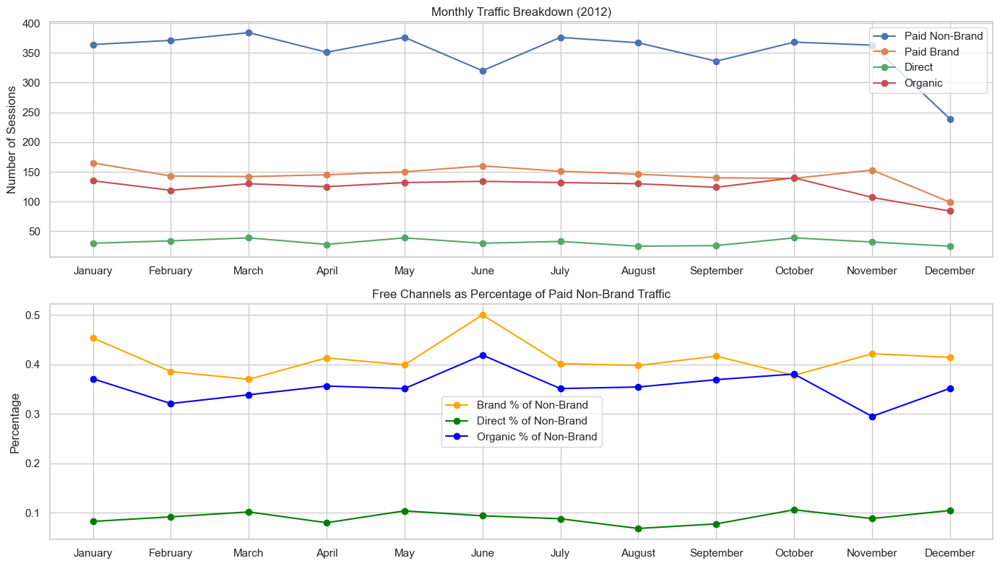

In [267]:
# Set style
sns.set(style="whitegrid")
plt.figure(figsize=(14, 8))

# Plot absolute numbers
plt.subplot(2, 1, 1)
plt.plot(monthly_traffic['month'], monthly_traffic['nonbrand'], label='Paid Non-Brand', marker='o')
plt.plot(monthly_traffic['month'], monthly_traffic['brand'], label='Paid Brand', marker='o')
plt.plot(monthly_traffic['month'], monthly_traffic['direct'], label='Direct', marker='o')
plt.plot(monthly_traffic['month'], monthly_traffic['organic'], label='Organic', marker='o')
plt.title('Monthly Traffic Breakdown (2012)')
plt.ylabel('Number of Sessions')
plt.legend()

# Plot percentages relative to nonbrand
plt.subplot(2, 1, 2)
plt.plot(monthly_traffic['month'], monthly_traffic['brand_percent_of_nonbrand'], 
         label='Brand % of Non-Brand', marker='o', color='orange')
plt.plot(monthly_traffic['month'], monthly_traffic['direct_percent_of_nonbrand'], 
         label='Direct % of Non-Brand', marker='o', color='green')
plt.plot(monthly_traffic['month'], monthly_traffic['organic_percent_of_nonbrand'], 
         label='Organic % of Non-Brand', marker='o', color='blue')
plt.title('Free Channels as Percentage of Paid Non-Brand Traffic')
plt.ylabel('Percentage')
plt.legend()

plt.tight_layout()
plt.show()

Findings:
 

The study shows good signs - the number of people coming to our site through our brand, directly, or through organic search is not just going up, but it’s also a bigger part of all the traffic we’re paying for. This is a good sign, as it means our brand is becoming more popular on its own and is bringing in more visitors.


#### BUSINESS PATTERNS & SEASONALITY:
Studying business patterns means finding useful information to make things run better and predict what might happen next. This includes looking at how things change throughout the day or week to figure out the best number of staff to have on hand. It also involves looking at how things change with the seasons to get ready for times when we might be busier or slower, which helps with planning and deciding where to put our resources.
 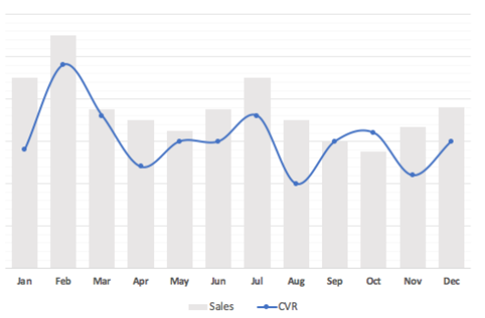
##### COMMON USE CASES: 
• Looking at how things change throughout the day or week to figure out the best number of staff to have on hand 

• Studying how things change with the seasons to get ready for times when we might be busier or slower


# ANALYZING SEASONALITY

*January 02, 2013*

Can you get the data on how many sessions and orders we had each month and week in 2012 for us to look at? We did really well that year, so looking at how things went might help us spot any trends that happen at certain times of the year. This could be really useful for planning for 2013. Thanks for your help with this.


### Generate sample data

In [274]:
np.random.seed(42)
date_range = pd.date_range('2012-01-01', '2012-12-31')
sessions_data = {
    'website_session_id': range(10000, 50000),
    'created_at': np.random.choice(date_range, 40000),
    'device_type': np.random.choice(['desktop', 'mobile'], 40000, p=[0.6, 0.4]),
    'utm_source': np.random.choice(['google', 'bing', 'organic'], 40000, p=[0.5, 0.3, 0.2])
}
website_sessions = pd.DataFrame(sessions_data)

### Create orders with holiday spikes

In [277]:
orders_data = {
    'order_id': range(5000, 15000),
    'website_session_id': np.random.choice(website_sessions['website_session_id'], 10000, replace=False),
    'created_at': np.random.choice(date_range, 10000)
}
orders = pd.DataFrame(orders_data)

### Add holiday spikes

In [280]:
black_friday_week = pd.date_range('2012-11-19', '2012-11-25')
cyber_monday_week = pd.date_range('2012-11-26', '2012-12-02')

extra_holiday_sessions = pd.DataFrame({
    'website_session_id': range(50000, 52000),
    'created_at': np.random.choice(black_friday_week, 2000),
    'device_type': np.random.choice(['desktop', 'mobile'], 2000, p=[0.7, 0.3]),
    'utm_source': 'holiday_promo'
})
website_sessions = pd.concat([website_sessions, extra_holiday_sessions])

extra_holiday_orders = pd.DataFrame({
    'order_id': range(15000, 16000),
    'website_session_id': np.random.choice(extra_holiday_sessions['website_session_id'], 1000, replace=False),
    'created_at': np.random.choice(black_friday_week, 1000)
})
orders = pd.concat([orders, extra_holiday_orders])

### Merge sessions and orders

In [283]:
merged_data = pd.merge(
    website_sessions,
    orders[['website_session_id', 'order_id', 'created_at']],
    on='website_session_id',
    how='left',
    suffixes=('_session', '_order')
)

### Filter for 2012 only

In [286]:
merged_data = merged_data[merged_data['created_at_session'] < '2013-01-01']


### Extract time components

In [289]:
merged_data['year'] = merged_data['created_at_session'].dt.year
merged_data['month'] = merged_data['created_at_session'].dt.month
merged_data['week'] = merged_data['created_at_session'].dt.isocalendar().week
merged_data['date'] = merged_data['created_at_session'].dt.date
merged_data['start_of_week'] = merged_data['created_at_session'] - pd.to_timedelta(merged_data['created_at_session'].dt.dayofweek, unit='d')

# Group and aggregate
seasonal_analysis = merged_data.groupby(['year', 'month', 'week', 'date', 'start_of_week']).agg(
    sessions=('website_session_id', 'nunique'),
    orders=('order_id', 'count')
).reset_index()

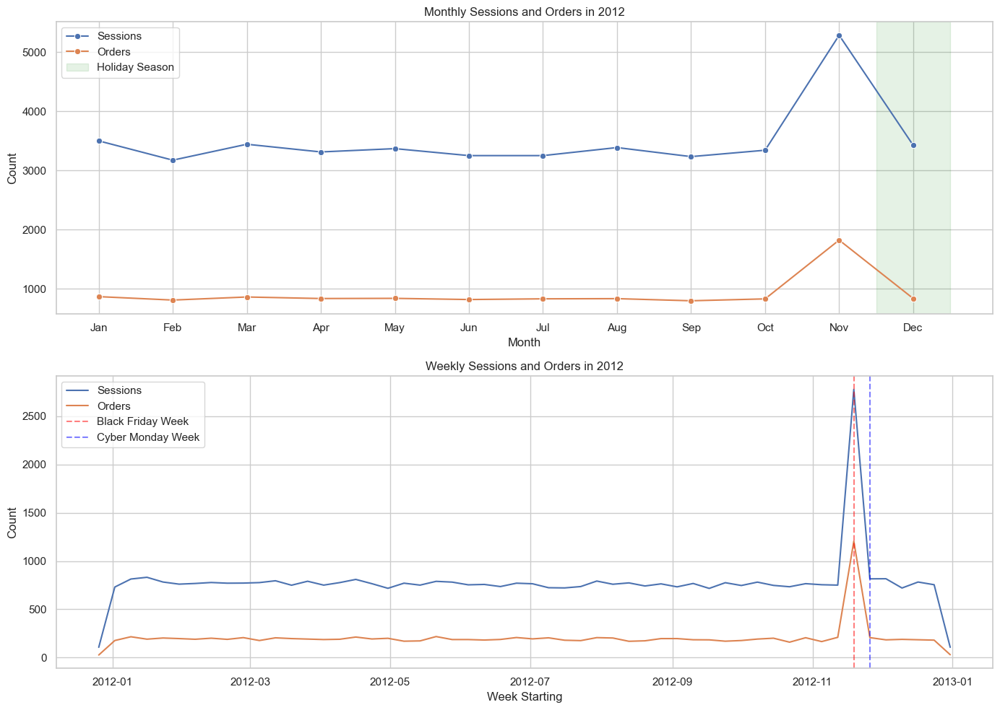

In [291]:
plt.figure(figsize=(14, 10))

# Monthly sessions and orders
monthly_data = seasonal_analysis.groupby(['year', 'month']).agg({
    'sessions': 'sum',
    'orders': 'sum'
}).reset_index()
monthly_data['month_name'] = monthly_data['month'].apply(lambda x: datetime(2012, x, 1).strftime('%b'))

plt.subplot(2, 1, 1)
sns.lineplot(x='month_name', y='sessions', data=monthly_data, marker='o', label='Sessions')
sns.lineplot(x='month_name', y='orders', data=monthly_data, marker='o', label='Orders')
plt.title('Monthly Sessions and Orders in 2012')
plt.xlabel('Month')
plt.ylabel('Count')
plt.axvspan(10.5, 11.5, color='green', alpha=0.1, label='Holiday Season')
plt.legend()

# Weekly trends with holiday markers
weekly_data = seasonal_analysis.groupby(['year', 'week', 'start_of_week']).agg({
    'sessions': 'sum',
    'orders': 'sum'
}).reset_index()

plt.subplot(2, 1, 2)
sns.lineplot(x='start_of_week', y='sessions', data=weekly_data, label='Sessions')
sns.lineplot(x='start_of_week', y='orders', data=weekly_data, label='Orders')
plt.title('Weekly Sessions and Orders in 2012')
plt.xlabel('Week Starting')
plt.ylabel('Count')

# Mark Black Friday and Cyber Monday weeks
black_friday = datetime(2012, 11, 19)
cyber_monday = datetime(2012, 11, 26)
plt.axvline(x=black_friday, color='red', linestyle='--', alpha=0.5, label='Black Friday Week')
plt.axvline(x=cyber_monday, color='blue', linestyle='--', alpha=0.5, label='Cyber Monday Week')
plt.legend()

plt.tight_layout()
plt.show()



Findings:

The analysis indicates a consistent growth throughout the year, with notable spikes in volume observed during the holiday months, particularly in the weeks surrounding Black Friday and Cyber Monday. This steady growth pattern, coupled with the holiday peaks, provides valuable insights for understanding our business trends in 2012.


# ANALYZING BUSINESS PATTERNS

*January 05, 2013*

Can you help me figure out how many people visit our website on average, at different times of the day and on different days of the week, between September 15 and November 15, 2013? We’re thinking of adding a live chat feature to our website, and this information will help us decide how many staff members we need to support it. Oh, and let’s not count the holidays, okay?


### Data Preparation

In [297]:
df = pd.read_csv('website_sessions.csv', parse_dates=['created_at'])

### Filter data between 2012-09-15 and 2012-11-15

In [300]:
df['created_at'] = pd.to_datetime(df['created_at'])
df_filtered = df[(df['created_at'] >= '2012-09-15') & (df['created_at'] <= '2012-11-15')]

### Create time features

In [303]:
df_filtered['created_date'] = df_filtered['created_at'].dt.date
df_filtered['week_of_day'] = df_filtered['created_at'].dt.weekday  # Monday = 0
df_filtered['hour'] = df_filtered['created_at'].dt.hour

C:\Users\SAGNIK\AppData\Local\Temp\ipykernel_9936\2164705859.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['created_date'] = df_filtered['created_at'].dt.date
C:\Users\SAGNIK\AppData\Local\Temp\ipykernel_9936\2164705859.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['week_of_day'] = df_filtered['created_at'].dt.weekday  # Monday = 0
C:\Users\SAGNIK\AppData\Local\Temp\ipykernel_9936\2164705859.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice f

### Count unique sessions per hour per day

In [306]:
grouped = df_filtered.groupby(['created_date', 'week_of_day', 'hour'])['website_session_id'] \
    .nunique().reset_index(name='sessions')

### Compute average sessions per hour per weekday

In [309]:
avg_sessions = grouped.groupby(['hour', 'week_of_day'])['sessions'].mean().reset_index()
avg_sessions['sessions'] = avg_sessions['sessions'].round(1)

### Pivot the data for heatmap

In [312]:
pivot_table = avg_sessions.pivot(index='hour', columns='week_of_day', values='sessions')
pivot_table.columns = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']


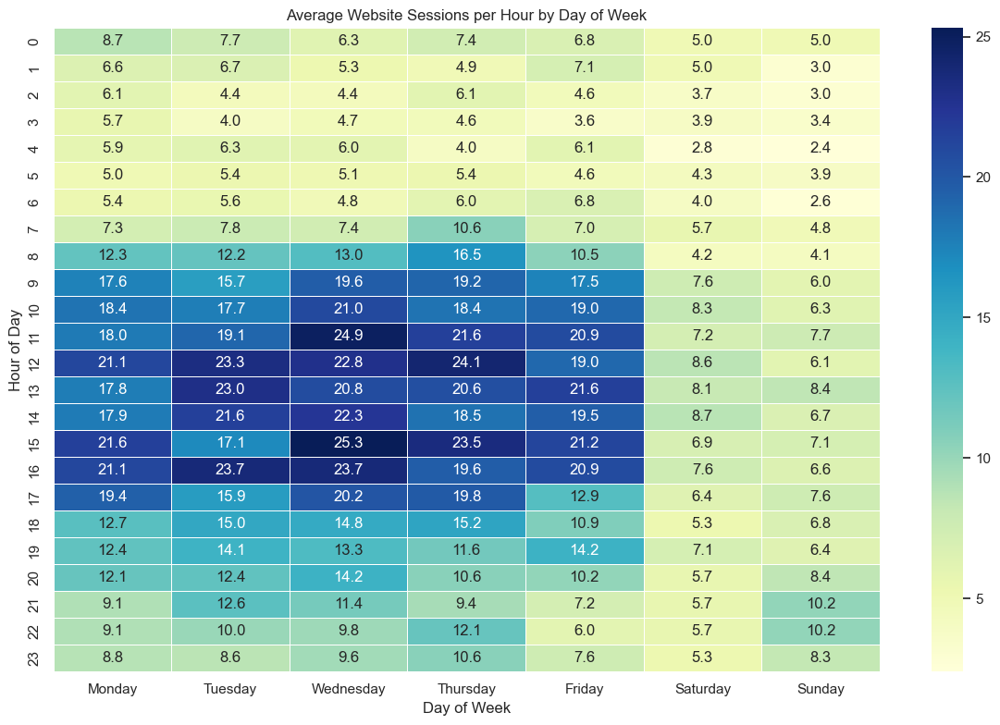

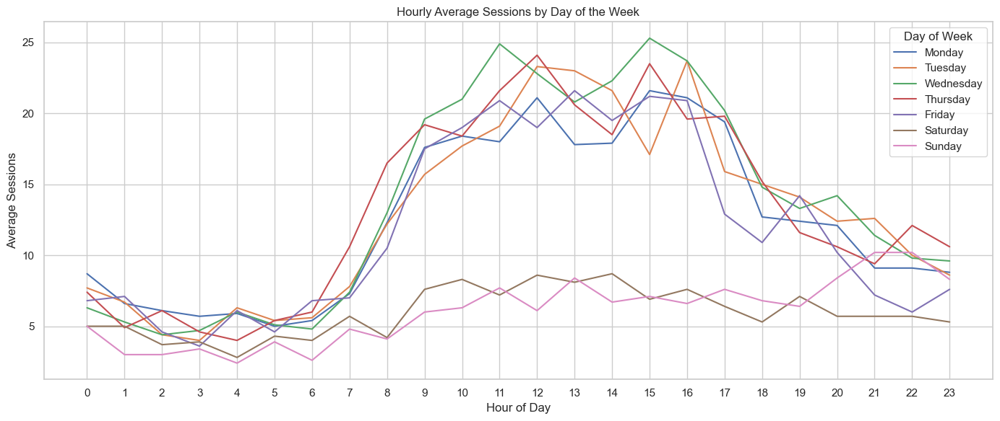

In [314]:
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, annot=True, fmt=".1f", cmap="YlGnBu", linewidths=0.5)
plt.title('Average Website Sessions per Hour by Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Hour of Day')
plt.tight_layout()
plt.show()

# Step 7: Line Plot
plt.figure(figsize=(14, 6))
for day in pivot_table.columns:
    plt.plot(pivot_table.index, pivot_table[day], label=day)

plt.title('Hourly Average Sessions by Day of the Week')
plt.xlabel('Hour of Day')
plt.ylabel('Average Sessions')
plt.xticks(range(0, 24))
plt.legend(title='Day of Week')
plt.grid(True)
plt.tight_layout()
plt.show()

Findings:
 
After talking to some companies that provide support, we’ve learned that if we have one person available to help customers 24/7, they should be able to handle about 10 customer sessions every hour. To make sure we have enough people to help during the busiest times, we’re thinking of having two people available from 8 in the morning to 5 in the afternoon, Monday to Friday. We believe this will help us serve our customers better.


### PRODUCT ANALYSIS:
Looking at how each product sells is really important. It helps us understand how much each product helps our business and how launching a new product affects everything else we sell. This means we need to look closely at how much money each product makes, watch what happens when we add a new product, and keep an eye on how sales change over time. This helps us get a full picture of how each product affects our business.
 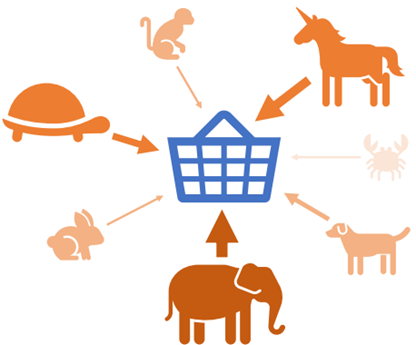
#### COMMON USE CASES: 
• Analyzing sales and revenue by product 

• Monitoring the impact of adding a new product to your product portfolio 

• Watching product sales trends to understand the overall health of your business


# PRODUCT LAUNCH SALES ANALYSIS

*April 05, 2013*

Can you help me gather some data starting from April 1, 2013? I’d like to know how many orders we get each month, what our conversion rates are, how much money we make from each visit to our website, and how each product is selling. This will help us understand how our second product has been doing since we started selling it on January 6th.



In [320]:
# Load data
sessions = pd.read_csv('website_sessions.csv', parse_dates=['created_at'])
orders = pd.read_csv('orders.csv', parse_dates=['created_at'])

# Filter sessions between April 1, 2012 and March 31, 2013
sessions_filtered = sessions[
    (sessions['created_at'] > '2012-04-01') &
    (sessions['created_at'] < '2013-04-01')
].copy()

# Merge orders onto sessions by session_id
merged_df = sessions_filtered.merge(
    orders[['order_id', 'website_session_id', 'price_usd', 'primary_product_id']],
    on='website_session_id',
    how='left'
)

# Extract year and month for grouping
merged_df['year'] = merged_df['created_at'].dt.year
merged_df['month'] = merged_df['created_at'].dt.month


### Aggregation

In [323]:
monthly_summary = merged_df.groupby(['year', 'month']).agg(
    sessions=('website_session_id', 'nunique'),
    orders=('order_id', 'nunique'),
    revenue=('price_usd', 'sum'),
    product_one_orders=('primary_product_id', lambda x: (x == 1).sum()),
    product_two_orders=('primary_product_id', lambda x: (x == 2).sum())
).reset_index()

# Calculate conversion rate and revenue per session
monthly_summary['conversion_rate'] = monthly_summary['orders'] / monthly_summary['sessions']
monthly_summary['revenue_per_session'] = monthly_summary['revenue'] / monthly_summary['sessions']


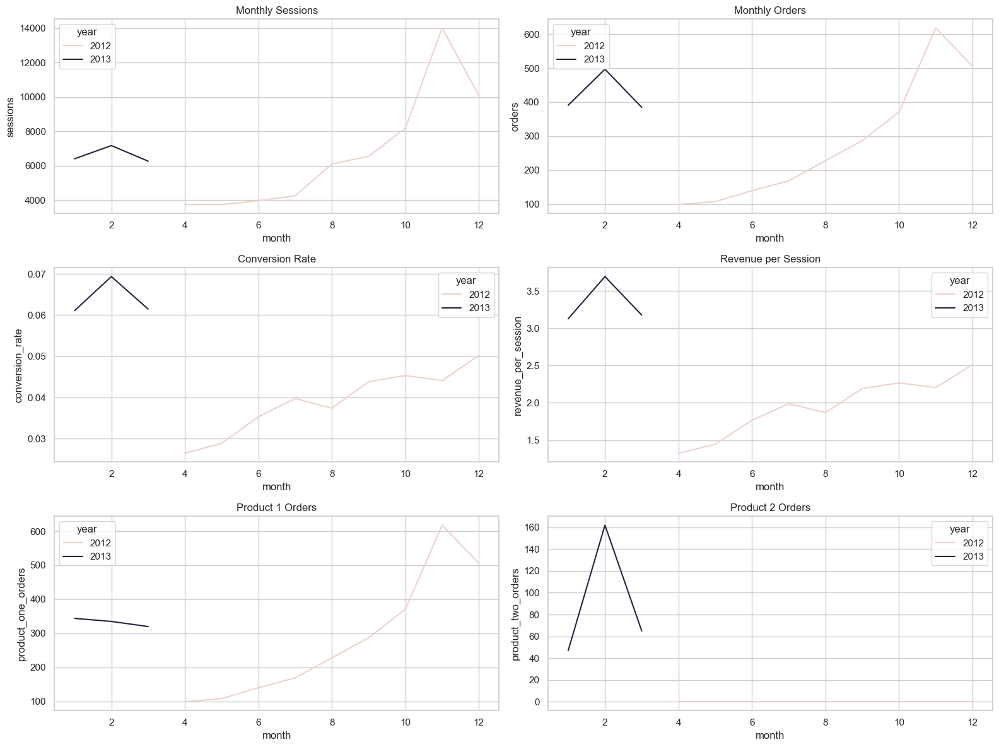

In [325]:
sns.set(style="whitegrid")
fig, axs = plt.subplots(3, 2, figsize=(16, 12))

# Monthly sessions
sns.lineplot(data=monthly_summary, x='month', y='sessions', hue='year', ax=axs[0, 0])
axs[0, 0].set_title('Monthly Sessions')

# Monthly orders
sns.lineplot(data=monthly_summary, x='month', y='orders', hue='year', ax=axs[0, 1])
axs[0, 1].set_title('Monthly Orders')

# Conversion Rate
sns.lineplot(data=monthly_summary, x='month', y='conversion_rate', hue='year', ax=axs[1, 0])
axs[1, 0].set_title('Conversion Rate')

# Revenue per Session
sns.lineplot(data=monthly_summary, x='month', y='revenue_per_session', hue='year', ax=axs[1, 1])
axs[1, 1].set_title('Revenue per Session')

# Product 1 Orders
sns.lineplot(data=monthly_summary, x='month', y='product_one_orders', hue='year', ax=axs[2, 0])
axs[2, 0].set_title('Product 1 Orders')

# Product 2 Orders
sns.lineplot(data=monthly_summary, x='month', y='product_two_orders', hue='year', ax=axs[2, 1])
axs[2, 1].set_title('Product 2 Orders')

plt.tight_layout()
plt.show()


In [326]:
# Display the summarized monthly metrics
print(monthly_summary.sort_values(['year', 'month']))


    year  month  sessions  orders   revenue  product_one_orders  \
0   2012      4      3734      99   4949.01                  99   
1   2012      5      3736     108   5398.92                 108   
2   2012      6      3963     140   6998.60                 140   
3   2012      7      4249     169   8448.31                 169   
4   2012      8      6097     228  11397.72                 228   
5   2012      9      6546     287  14347.13                 287   
6   2012     10      8183     371  18546.29                 371   
7   2012     11     14011     618  30893.82                 618   
8   2012     12     10072     506  25294.94                 506   
9   2013      1      6401     391  20016.09                 344   
10  2013      2      7168     497  26465.03                 335   
11  2013      3      6264     385  19896.15                 320   

    product_two_orders  conversion_rate  revenue_per_session  
0                    0         0.026513             1.325391  
1 

Findings:

Our analysis shows that things are going well. We’re seeing better conversion rates and making more money from each visit to our website. But it’s hard to tell if this is because of the new product we launched in January or if it’s just because our business is doing better overall. We might need to look into this more to figure out exactly what’s causing these good results.


### What is PRODUCT LEVEL WEBSITE ANALYSIS?

Looking at how customers use our website can help us understand how well each product is doing. This means seeing which products people are most interested in when they see a page with lots of products, checking if adding a new product helps us sell more overall, and seeing if some products are easier to sell than others. This helps us understand what our customers like and how we can sell each product better.
 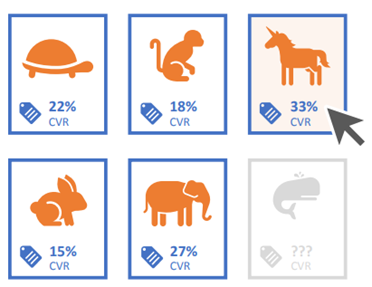
### COMMON USE CASES: 
• Understanding which of your products generate the most interest on multi-product showcase pages 

• Analyzing the impact on website conversion rates when you add a new product 

• Building product-specific conversion funnels to understand whether certain products convert better than others.



# PRODUCT PATHING ANALYSIS

*April 06, 2014*

Could you please provide the data on how many people clicked on each product on our website’s product page since we introduced the new product on January 6th, 2013? Also, could you compare this data with the click rates for the three months before the new product was launched? This comparison will help us understand how the new product affected the user’s journey and their decisions to purchase on our website.


### Filter to /products pageviews and classify time period

In [339]:
# Example: filter pageviews before a certain date (if needed)
pageviews_filtered = pageviews[pageviews['created_at'] < '2013-02-01']
pageviews_filtered = pageviews.copy()
product_views = pageviews_filtered[
    pageviews_filtered['pageview_url'] == '/products'
].copy()

product_views['time_period'] = np.where(
    product_views['created_at'] < pd.Timestamp('2013-01-06'),
    'A.Pre_Product_2',
    'B.Post_Product_2'
)


### Get the next pageview in the session after the /products view

In [342]:
# Join all pageviews with product views on session ID
merged = product_views.merge(
    pageviews_filtered,
    on='website_session_id',
    suffixes=('_product', '_next')
)

# Only consider pageviews that occurred AFTER the /products view in the session
valid_nexts = merged[
    merged['website_pageview_id_next'] > merged['website_pageview_id_product']
]

# Sort to find the immediate next pageview
valid_nexts_sorted = valid_nexts.sort_values(
    by=['website_session_id', 'website_pageview_id_next']
)

# Keep the first next pageview only
next_click = valid_nexts_sorted.groupby('website_session_id').first().reset_index()

# Extract necessary fields
next_click_df = next_click[[
    'website_session_id',
    'time_period',
    'pageview_url_next'
]]


### Combine sessions with and without a next click

In [345]:
# All /products sessions
all_sessions = product_views[['website_session_id', 'time_period']].drop_duplicates()

# Merge to add next pageview info (some will be null)
final_df = all_sessions.merge(
    next_click_df,
    on=['website_session_id', 'time_period'],
    how='left'
)


### Summarize Click Behavior

In [348]:
summary = final_df.groupby('time_period').agg(
    sessions=('website_session_id', 'nunique'),
    w_next_pg=('pageview_url_next', lambda x: x.notnull().sum()),
    to_mrfuzzy=('pageview_url_next', lambda x: (x == '/the-original-mr-fuzzy').sum()),
    to_lovebear=('pageview_url_next', lambda x: (x == '/the-forever-love-bear').sum())
).reset_index()

# Percentages
summary['pct_w_next_pg'] = summary['w_next_pg'] / summary['sessions']
summary['pct_to_mrfuzzy'] = summary['to_mrfuzzy'] / summary['sessions']
summary['pct_to_lovebear'] = summary['to_lovebear'] / summary['sessions']

# Round for presentation
summary[['pct_w_next_pg', 'pct_to_mrfuzzy', 'pct_to_lovebear']] = summary[[
    'pct_w_next_pg', 'pct_to_mrfuzzy', 'pct_to_lovebear'
]].round(4)


### Pretty Print Table

In [350]:
from tabulate import tabulate
print(tabulate(summary, headers='keys', tablefmt='fancy_grid', showindex=False))


╒══════════════════╤════════════╤═════════════╤══════════════╤═══════════════╤═════════════════╤══════════════════╤═══════════════════╕
│ time_period      │   sessions │   w_next_pg │   to_mrfuzzy │   to_lovebear │   pct_w_next_pg │   pct_to_mrfuzzy │   pct_to_lovebear │
╞══════════════════╪════════════╪═════════════╪══════════════╪═══════════════╪═════════════════╪══════════════════╪═══════════════════╡
│ A.Pre_Product_2  │      30009 │       21651 │        21651 │             0 │          0.7215 │           0.7215 │            0      │
├──────────────────┼────────────┼─────────────┼──────────────┼───────────────┼─────────────────┼──────────────────┼───────────────────┤
│ B.Post_Product_2 │     231222 │      188563 │       140874 │         26033 │          0.8155 │           0.6093 │            0.1126 │
╘══════════════════╧════════════╧═════════════╧══════════════╧═══════════════╧═════════════════╧══════════════════╧═══════════════════╛


C:\Users\SAGNIK\AppData\Local\Temp\ipykernel_9936\2502110348.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=summary, x='time_period', y='pct_w_next_pg', palette='Blues_d')


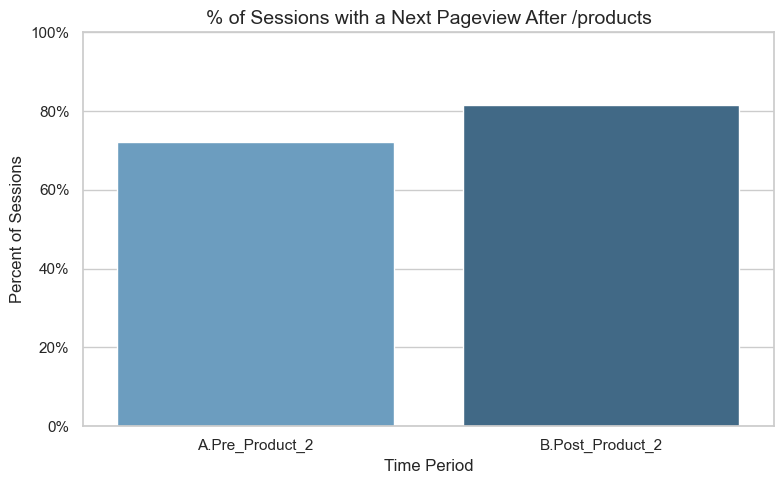

In [352]:
import matplotlib.pyplot as plt
import seaborn as sns

# Bar plot: % of sessions with any next pageview
plt.figure(figsize=(8, 5))
sns.barplot(data=summary, x='time_period', y='pct_w_next_pg', palette='Blues_d')
plt.title('% of Sessions with a Next Pageview After /products', fontsize=14)
plt.ylabel('Percent of Sessions')
plt.xlabel('Time Period')
plt.ylim(0, 1)
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: '{:.0%}'.format(y)))
plt.tight_layout()
plt.show()


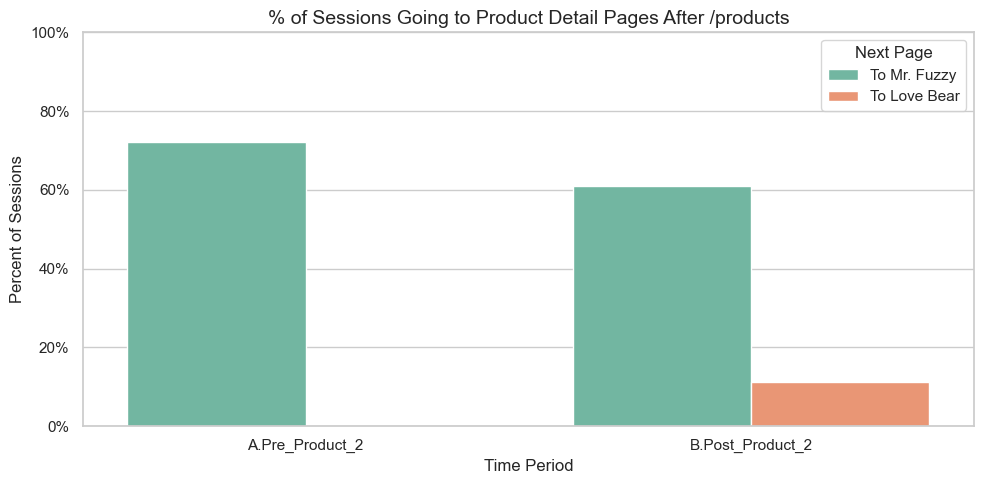

In [354]:
# Melt data for easier plotting
plot_data = summary.melt(
    id_vars='time_period',
    value_vars=['pct_to_mrfuzzy', 'pct_to_lovebear'],
    var_name='destination',
    value_name='pct'
)

# Label cleanup
plot_data['destination'] = plot_data['destination'].map({
    'pct_to_mrfuzzy': 'To Mr. Fuzzy',
    'pct_to_lovebear': 'To Love Bear'
})

# Grouped bar plot
plt.figure(figsize=(10, 5))
sns.barplot(data=plot_data, x='time_period', y='pct', hue='destination', palette='Set2')
plt.title('% of Sessions Going to Product Detail Pages After /products', fontsize=14)
plt.ylabel('Percent of Sessions')
plt.xlabel('Time Period')
plt.ylim(0, 1)
plt.legend(title='Next Page')
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: '{:.0%}'.format(y)))
plt.tight_layout()
plt.show()


Findings:
 

Our analysis shows that fewer people are clicking on Mr. Fuzzy on our products page since we launched Love Bear. But, more people are clicking on our products overall. This suggests that Love Bear is making more people interested in what we offer. So, even though fewer people are looking at Mr. Fuzzy, the introduction of Love Bear is helping us engage more with our users.


# PRODUCT CONVERISON FUNNELS

*April 10, 2014*

Could you please look into how our customers are moving from the Love Bear and Mr. Fuzzy product pages to finally buying the product since January 6th? I’m really interested in understanding this journey for all the people visiting our website. Comparing these journeys will help us understand how well each product is doing in turning page visits into purchases.



In [359]:
import pandas as pd

# Step 1: Load and prepare data
# website_pageviews = pd.read_csv("website_pageviews.csv")
website_pageviews['created_at'] = pd.to_datetime(website_pageviews['created_at'])

# Step 2: Get all sessions that viewed product pages in date range
product_pages = ['/the-original-mr-fuzzy', '/the-forever-love-bear']
product_sessions = website_pageviews[
    (website_pageviews['created_at'] >= '2013-01-06') &
    (website_pageviews['created_at'] < '2013-04-10') &
    (website_pageviews['pageview_url'].isin(product_pages))
][['website_session_id', 'website_pageview_id', 'pageview_url']] \
.rename(columns={'pageview_url': 'product_page_seen'})

# Step 3: For each session, get the FIRST product pageview only
first_product_views = product_sessions \
    .sort_values(['website_session_id', 'website_pageview_id']) \
    .drop_duplicates('website_session_id', keep='first')

# Step 4: Get all subsequent pageviews for these sessions
subsequent_pageviews = pd.merge(
    first_product_views[['website_session_id', 'website_pageview_id', 'product_page_seen']],
    website_pageviews,
    on='website_session_id',
    suffixes=('_product', '')
)

# Only keep pageviews that happened AFTER the product pageview
subsequent_pageviews = subsequent_pageviews[
    subsequent_pageviews['website_pageview_id'] > subsequent_pageviews['website_pageview_id_product']
]

# Step 5: Mark funnel steps
subsequent_pageviews['cart_page'] = (subsequent_pageviews['pageview_url'] == '/cart').astype(int)
subsequent_pageviews['shipping_page'] = (subsequent_pageviews['pageview_url'] == '/shipping').astype(int)
subsequent_pageviews['billing2_page'] = (subsequent_pageviews['pageview_url'] == '/billing-2').astype(int)
subsequent_pageviews['thankyou_page'] = (subsequent_pageviews['pageview_url'] == '/thank-you-for-your-order').astype(int)

# Step 6: Create session-level flags (did they reach each step?)
session_funnel = subsequent_pageviews.groupby(['website_session_id', 'product_page_seen']).agg({
    'cart_page': 'max',
    'shipping_page': 'max',
    'billing2_page': 'max',
    'thankyou_page': 'max'
}).reset_index()

# Step 7: Include sessions that didn't progress beyond product page
all_sessions = first_product_views['website_session_id'].unique()
completed_sessions = session_funnel['website_session_id'].unique()
missing_sessions = set(all_sessions) - set(completed_sessions)

if len(missing_sessions) > 0:
    missing_data = first_product_views[first_product_views['website_session_id'].isin(missing_sessions)].copy()
    missing_data['cart_page'] = 0
    missing_data['shipping_page'] = 0
    missing_data['billing2_page'] = 0
    missing_data['thankyou_page'] = 0
    session_funnel = pd.concat([session_funnel, missing_data], ignore_index=True)

# Step 8: Label products
session_funnel['product_seen'] = session_funnel['product_page_seen'].map({
    '/the-original-mr-fuzzy': 'mrfuzzy',
    '/the-forever-love-bear': 'lovebear'
})

# Step 9: Calculate funnel metrics
summary = session_funnel.groupby('product_seen').agg(
    sessions=('website_session_id', 'nunique'),
    to_cart=('cart_page', 'sum'),
    to_shipping=('shipping_page', 'sum'),
    to_billing2=('billing2_page', 'sum'),
    to_thankyou=('thankyou_page', 'sum')
).reset_index()

# Step 10: Calculate conversion rates
summary['cart_click_rt'] = (summary['to_cart'] / summary['sessions']).round(4)
summary['shipping_click_rt'] = (summary['to_shipping'] / summary['sessions']).round(4)
summary['billing2_click_rt'] = (summary['to_billing2'] / summary['sessions']).round(4)
summary['thankyou_click_rt'] = (summary['to_thankyou'] / summary['sessions']).round(4)

# Step 11: Format for display
formatted_summary = summary.copy()
for col in ['cart_click_rt', 'shipping_click_rt', 'billing2_click_rt', 'thankyou_click_rt']:
    formatted_summary[col] = (formatted_summary[col] * 100).round(2).astype(str) + '%'

# Step 12: Reorder columns
formatted_summary = formatted_summary[[
    'product_seen', 'sessions',
    'to_cart', 'cart_click_rt',
    'to_shipping', 'shipping_click_rt',
    'to_billing2', 'billing2_click_rt',
    'to_thankyou', 'thankyou_click_rt'
]]

# Display results
from IPython.display import display
display(formatted_summary)

,product_seen,sessions,to_cart,cart_click_rt,to_shipping,shipping_click_rt,to_billing2,billing2_click_rt,to_thankyou,thankyou_click_rt
0,lovebear,1599,877,54.85%,603,37.71%,488,30.52%,301,18.82%
1,mrfuzzy,6985,3038,43.49%,2084,29.84%,1710,24.48%,1088,15.58%


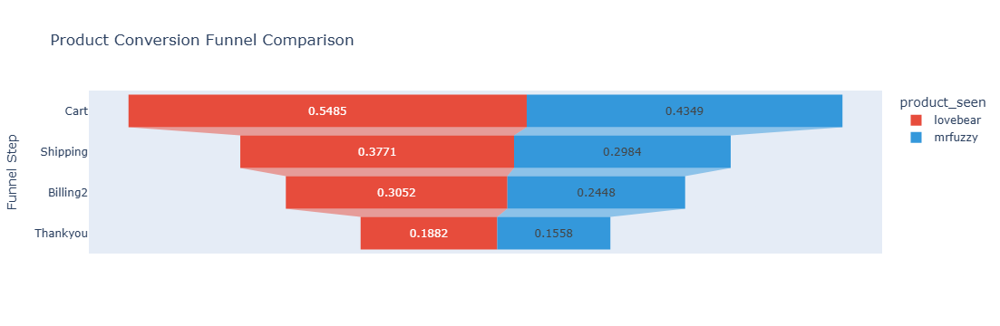

In [361]:
import plotly.express as px

# Prepare data for visualization
viz_data = summary.melt(id_vars=['product_seen'], 
                        value_vars=['cart_click_rt', 'shipping_click_rt', 
                                   'billing2_click_rt', 'thankyou_click_rt'],
                        var_name='funnel_step', 
                        value_name='conversion_rate')

# Clean step names
viz_data['funnel_step'] = viz_data['funnel_step'].str.replace('_click_rt', '').str.replace('_', ' ').str.title()

fig = px.funnel(viz_data, 
                x='conversion_rate', 
                y='funnel_step', 
                color='product_seen',
                title='Product Conversion Funnel Comparison',
                labels={'conversion_rate': 'Conversion Rate', 'funnel_step': 'Funnel Step'},
                color_discrete_map={'mrfuzzy': '#3498db', 'lovebear': '#e74c3c'})

fig.update_layout(yaxis={'categoryorder':'array', 
                        'categoryarray':['Cart', 'Shipping', 'Billing2', 'Thankyou']})
fig.show()

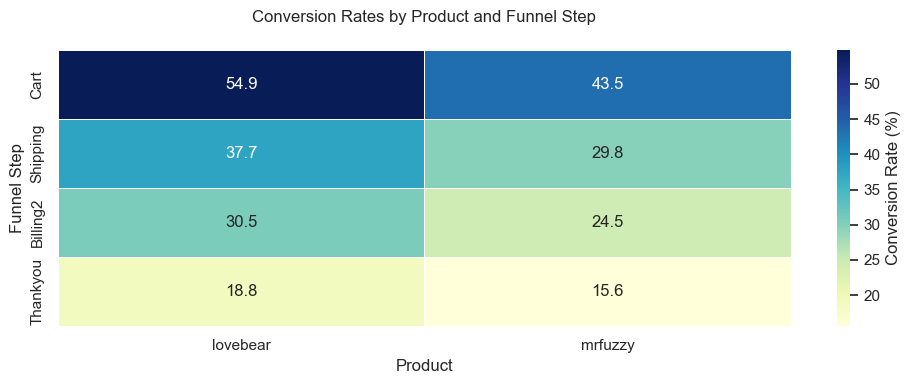

In [362]:
# Prepare data for heatmap
heatmap_data = summary[['product_seen', 'cart_click_rt', 'shipping_click_rt', 
                       'billing2_click_rt', 'thankyou_click_rt']].copy()
heatmap_data.set_index('product_seen', inplace=True)
heatmap_data.columns = [col.replace('_click_rt', '').replace('_', ' ').title() for col in heatmap_data.columns]

plt.figure(figsize=(10, 4))
sns.heatmap(heatmap_data.T * 100, 
            annot=True, 
            fmt=".1f", 
            cmap="YlGnBu",
            linewidths=.5,
            cbar_kws={'label': 'Conversion Rate (%)'})
plt.title('Conversion Rates by Product and Funnel Step', pad=20)
plt.xlabel('Product')
plt.ylabel('Funnel Step')
plt.tight_layout()
plt.show()

Findings:

Our findings are really positive! We found out earlier that adding Love Bear to our products increased the overall number of clicks from the products page. This analysis confirms that. Specifically, it shows that more people are clicking on Love Bear to add it to their cart, and the rest of the buying process is just as successful as it is for Mr. Fuzzy. This strongly suggests that adding Love Bear to our product line has been a great move for our business.


### What Is Cross-Selling Products?

Cross-sell analysis is like figuring out what products people often buy together, and using this information to suggest products to customers. This involves finding out which products are often bought together, trying out different ways to suggest products on your website, and seeing how these suggestions affect sales and income when you try to sell more products. Basically, cross-sell analysis is about making product suggestions better and increasing sales by encouraging customers to buy products that go well together.

 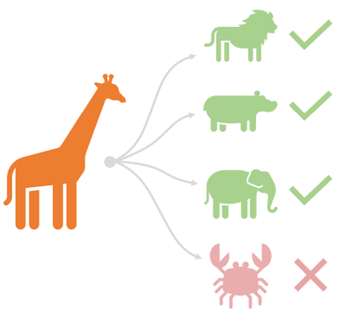
#### COMMON USE CASES: 
• Understanding which products are often purchased together 
• Testing and optimizing the way you cross-sell products on your website 
• Understanding the conversion rate impact and the overall revenue impact of trying to cross sell additional products


# CROSS-SELL ANALYSIS

*November 22, 2013*

Could you please compare the numbers for the month before and after we started letting customers add a second product to their cart on September 25th? I’d like to see how often people clicked from the cart page, the average number of products in each order, the average amount of money spent per order, and the total money we made for each view of the cart page. This will help us understand how this change affected how customers shop and how much money we make.


### Convert dates to datetime

In [368]:
website_pageviews['created_at'] = pd.to_datetime(website_pageviews['created_at'])
orders['created_at'] = pd.to_datetime(orders['created_at'])

### Identify cart pageviews and classify time periods

In [370]:
cart_sessions = website_pageviews[
    (website_pageviews['created_at'] >= '2013-08-25') & 
    (website_pageviews['created_at'] <= '2013-10-25') &
    (website_pageviews['pageview_url'] == '/cart')
].copy()

cart_sessions['time_period'] = np.where(
    cart_sessions['created_at'] < '2013-09-25',
    'A. Pre Cross-Sell',
    'B. Post Cross-Sell'
)

### Find sessions that clicked through to another page after cart

In [376]:
subsequent_pageviews = pd.merge(
    cart_sessions[['website_session_id', 'website_pageview_id', 'time_period']],
    website_pageviews,
    on='website_session_id',
    suffixes=('_cart', '')
)

clickthrough_sessions = subsequent_pageviews[
    subsequent_pageviews['website_pageview_id'] > subsequent_pageviews['website_pageview_id_cart']
].groupby(['time_period', 'website_session_id'])['website_pageview_id'].min().reset_index()


### Find orders associated with cart sessions

In [379]:
cart_orders = pd.merge(
    cart_sessions[['website_session_id', 'time_period']],
    orders,
    left_on='website_session_id',
    right_on='website_session_id',
    how='left'
)

### Combine all data for analysis

In [382]:
final_data = pd.merge(
    cart_sessions[['website_session_id', 'time_period']],
    clickthrough_sessions[['website_session_id']].assign(clicked_through=1),
    on='website_session_id',
    how='left'
).merge(
    cart_orders[['website_session_id', 'order_id', 'items_purchased', 'price_usd']],
    on='website_session_id',
    how='left'
)

### Fill NA values

In [385]:
final_data['clicked_through'] = final_data['clicked_through'].fillna(0)
final_data['placed_order'] = final_data['order_id'].notna().astype(int)
final_data['items_purchased'] = final_data['items_purchased'].fillna(0)
final_data['price_usd'] = final_data['price_usd'].fillna(0)

### Calculate aggregate metrics

In [388]:
results = final_data.groupby('time_period').agg(
    cart_sessions=('website_session_id', 'nunique'),
    clickthroughs=('clicked_through', 'sum'),
    orders_placed=('placed_order', 'sum'),
    total_products=('items_purchased', 'sum'),
    total_revenue=('price_usd', 'sum')
).reset_index()

### Calculate derived metrics

In [391]:
results['cart_ctr'] = results['clickthroughs'] / results['cart_sessions']
results['products_per_order'] = results['total_products'] / results['orders_placed']
results['aov'] = results['total_revenue'] / results['orders_placed']
results['rev_per_cart'] = results['total_revenue'] / results['cart_sessions']

### Format for display

In [394]:
display_results = results.copy()
display_results['cart_ctr'] = display_results['cart_ctr'].map('{:.1%}'.format)
display_results['aov'] = display_results['aov'].map('${:,.2f}'.format)
display_results['rev_per_cart'] = display_results['rev_per_cart'].map('${:,.2f}'.format)

print("Cross-Sell Performance Comparison:")
display(display_results)


Cross-Sell Performance Comparison:


,time_period,cart_sessions,clickthroughs,orders_placed,total_products,total_revenue,cart_ctr,products_per_order,aov,rev_per_cart
0,A. Pre Cross-Sell,1830,1229.0,652,652.0,33523.48,67.2%,1.000000,$51.42,$18.32
1,B. Post Cross-Sell,1975,1351.0,671,701.0,36402.99,68.4%,1.044709,$54.25,$18.43


C:\Users\SAGNIK\AppData\Local\Temp\ipykernel_9936\2699463336.py:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\SAGNIK\AppData\Local\Temp\ipykernel_9936\2699463336.py:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\SAGNIK\AppData\Local\Temp\ipykernel_9936\2699463336.py:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\SAGNIK\AppData\Local\Temp\ipykernel_9936\2699463336.py:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same ef

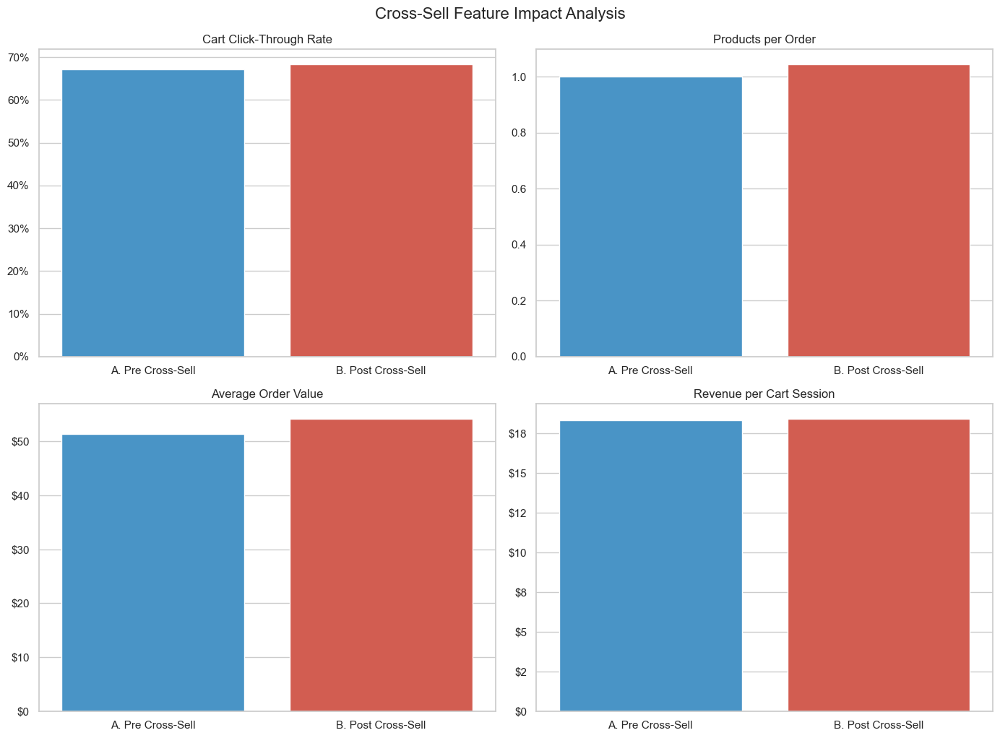

In [396]:
metrics_to_plot = ['cart_ctr', 'products_per_order', 'aov', 'rev_per_cart']
metric_names = ['Cart Click-Through Rate', 'Products per Order', 'Average Order Value', 'Revenue per Cart Session']

plt.figure(figsize=(14, 10))
for i, metric in enumerate(metrics_to_plot):
    plt.subplot(2, 2, i+1)
    sns.barplot(data=results, x='time_period', y=metric, palette=['#3498db', '#e74c3c'])
    plt.title(metric_names[i])
    
    # Format y-axis based on metric
    if metric == 'cart_ctr':
        plt.gca().yaxis.set_major_formatter('{:.0%}'.format)
    elif metric in ['aov', 'rev_per_cart']:
        plt.gca().yaxis.set_major_formatter('${x:,.0f}')
    
    plt.xlabel('')
    plt.ylabel('')

plt.tight_layout()
plt.suptitle('Cross-Sell Feature Impact Analysis', y=1.02, fontsize=16)
plt.show()

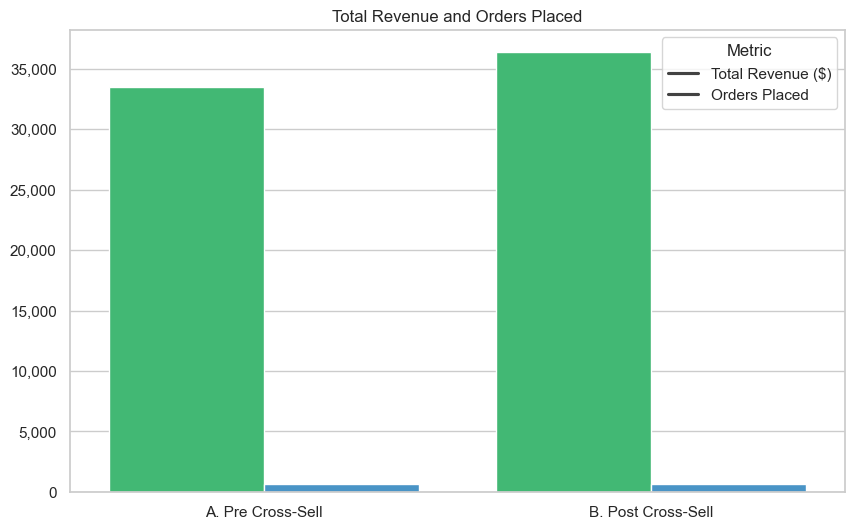

In [398]:
revenue_components = pd.melt(
    results,
    id_vars=['time_period'],
    value_vars=['total_revenue', 'orders_placed'],
    var_name='metric',
    value_name='value'
)

plt.figure(figsize=(10, 6))
sns.barplot(
    data=revenue_components,
    x='time_period',
    y='value',
    hue='metric',
    palette=['#2ecc71', '#3498db']
)
plt.title('Total Revenue and Orders Placed')
plt.ylabel('')
plt.xlabel('')
plt.gca().yaxis.set_major_formatter('{x:,.0f}')
plt.legend(title='Metric', labels=['Total Revenue ($)', 'Orders Placed'])
plt.show()


Findings:

 

Our analysis shows good results. The number of people clicking from the cart page didn’t go down, which is a relief. Plus, we’re seeing some positive changes. There’s a small increase in the average number of products per order, the average amount of money spent per order, and the total money we make for each view of the cart page since we added the option to suggest more products. While this might not be a huge change, the overall trend shows that customers are more engaged and we have the potential to make more money with this new feature.


# PORTFOLIO EXPANSION ANALYSIS

*January 12, 2014*

Could you please compare the numbers for the month before and after we launched our third product, Birthday Bear, on December 12th, 2013? I’d like to see if there were any changes in how often people visiting our website ended up placing an order, the average amount of money spent per order, the average number of products per order, and the total money we make for each visit to our website. This will help us understand how the new product affected how customers shop and our key performance numbers.


### Convert dates to datetime`

In [452]:
website_sessions = pd.read_csv('website_sessions.csv')
orders = pd.read_csv('orders.csv')
website_sessions['created_at'] = pd.to_datetime(website_sessions['created_at'])
orders['created_at'] = pd.to_datetime(orders['created_at'])

### Filter sessions and classify time periods

In [455]:
analysis_sessions = website_sessions[
    (website_sessions['created_at'] >= '2013-11-12') & 
    (website_sessions['created_at'] <= '2014-01-12')
].copy()

analysis_sessions['time_period'] = np.where(
    analysis_sessions['created_at'] < '2013-12-12',
    'A. Pre-Birthday Bear',
    'B. Post-Birthday Bear'
)

### Merge with orders data

In [458]:
combined_data = pd.merge(
    analysis_sessions[['website_session_id', 'created_at', 'time_period']],
    orders,
    left_on='website_session_id',
    right_on='website_session_id',
    how='left'
)


### Calculate metrics

In [461]:
results = combined_data.groupby('time_period').agg(
    sessions=('website_session_id', 'nunique'),
    orders=('order_id', 'nunique'),
    total_revenue=('price_usd', 'sum'),
    total_products=('items_purchased', 'sum')
).reset_index()

### Calculate derived metrics

In [464]:
results['conversion_rate'] = results['orders'] / results['sessions']
results['average_order_value'] = results['total_revenue'] / results['orders']
results['products_per_order'] = results['total_products'] / results['orders']
results['revenue_per_session'] = results['total_revenue'] / results['sessions']

# Format for display
display_results = results.copy()
display_results['conversion_rate'] = display_results['conversion_rate'].map('{:.1%}'.format)
display_results['average_order_value'] = display_results['average_order_value'].map('${:,.2f}'.format)
display_results['revenue_per_session'] = display_results['revenue_per_session'].map('${:,.2f}'.format)

print("Portfolio Expansion Performance Comparison:")
display(display_results[['time_period', 'sessions', 'orders', 'conversion_rate',
                        'total_revenue', 'average_order_value', 'products_per_order',
                        'revenue_per_session']])

Portfolio Expansion Performance Comparison:


,time_period,sessions,orders,conversion_rate,total_revenue,average_order_value,products_per_order,revenue_per_session
0,A. Pre-Birthday Bear,17343,1055,6.1%,57208.96,$54.23,1.046445,$3.30
1,B. Post-Birthday Bear,13383,940,7.0%,53515.44,$56.93,1.123404,$4.00


C:\Users\SAGNIK\AppData\Local\Temp\ipykernel_9936\3613055030.py:16: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\SAGNIK\AppData\Local\Temp\ipykernel_9936\3613055030.py:16: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\SAGNIK\AppData\Local\Temp\ipykernel_9936\3613055030.py:16: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\SAGNIK\AppData\Local\Temp\ipykernel_9936\3613055030.py:16: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the sam

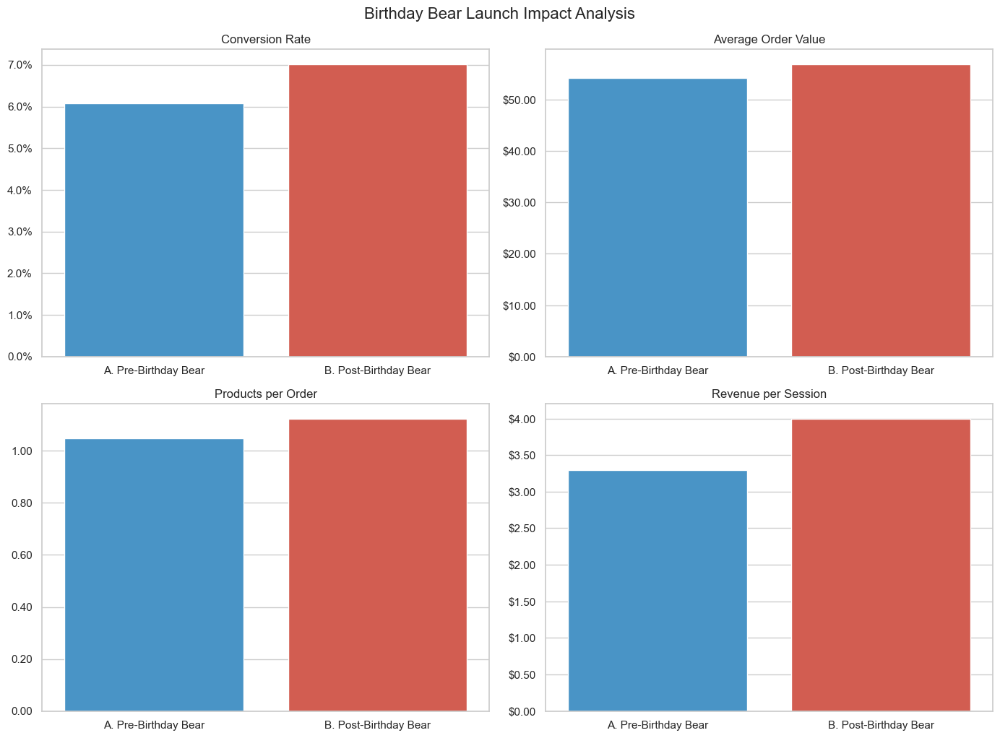

In [466]:
metrics = ['conversion_rate', 'average_order_value', 'products_per_order', 'revenue_per_session']
metric_names = ['Conversion Rate', 'Average Order Value', 'Products per Order', 'Revenue per Session']

# Corresponding formatter functions
formatters = [
    FuncFormatter(lambda y, _: '{:.1%}'.format(y)),                     # Percentage
    FuncFormatter(lambda y, _: f'${y:,.2f}'),                           # Currency
    FuncFormatter(lambda y, _: f'{y:.2f}'),                             # Number with 2 decimals
    FuncFormatter(lambda y, _: f'${y:,.2f}')                            # Currency
]

plt.figure(figsize=(14, 10))

for i, metric in enumerate(metrics):
    plt.subplot(2, 2, i + 1)
    ax = sns.barplot(data=results, x='time_period', y=metric, palette=['#3498db', '#e74c3c'])
    ax.set_title(metric_names[i])
    ax.yaxis.set_major_formatter(formatters[i])  # Use robust formatter here
    plt.xlabel('')
    plt.ylabel('')

plt.tight_layout()
plt.suptitle('Birthday Bear Launch Impact Analysis', y=1.02, fontsize=16)
plt.show()


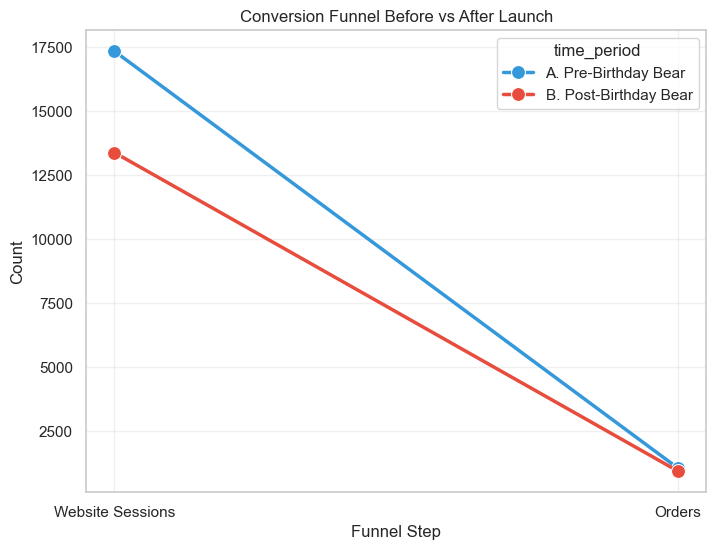

In [468]:
funnel_data = results[['time_period', 'sessions', 'orders']].copy()
funnel_data['reached_site'] = funnel_data['sessions']
funnel_data = funnel_data.melt(
    id_vars='time_period',
    value_vars=['reached_site', 'orders'],
    var_name='funnel_step',
    value_name='count'
)

plt.figure(figsize=(8, 6))
sns.lineplot(
    data=funnel_data,
    x='funnel_step',
    y='count',
    hue='time_period',
    marker='o',
    markersize=10,
    palette=['#3498db', '#e74c3c'],
    linewidth=2.5
)
plt.title('Conversion Funnel Before vs After Launch')
plt.xlabel('Funnel Step')
plt.ylabel('Count')
plt.xticks([0, 1], ['Website Sessions', 'Orders'])
plt.grid(True, alpha=0.3)
plt.show()

Findings:
 
Our analysis shows that all our important numbers have gotten better since we launched our third product. This is really great news! It shows that the new product has had a positive effect on how often people visiting our website end up placing an order, the average amount of money spent per order, the average number of products per order, and the total money we make for each visit to our website.


### What Is Product Refund Analysis?
Analyzing product refund rates is essential for quality control and identifying areas that may require attention. This process involves monitoring products from various suppliers, understanding refund rates based on different price points, and incorporating product refund rates and associated costs into the overall assessment of business performance. By doing so, businesses can maintain quality standards, pinpoint potential issues, and make informed decisions about product offerings and supplier relationships.

 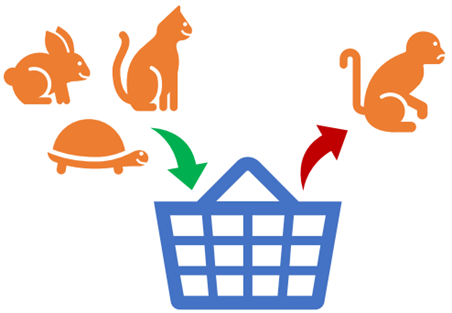
#### COMMON USE CASES: 
• Monitoring products from different suppliers 

• Understanding refund rates for products at different price points 

• Taking product refund rates and the associated costs into account when assessing the overall performance of your business


# PRODUCT REFUND RATES

*October 15, 2014*

Could you please show me how often each product was returned every month, especially for Mr. Fuzzy, from September 2013 until now? This will help us check if we’ve fixed the quality problems with Mr. Fuzzy that we had until September 2013 and that came up again in August/September 2014, especially since we started working with a new supplier on September 16, 2014. Does that make sense?


### Convert dates to datetime

In [472]:
order_items['created_at'] = pd.to_datetime(order_items['created_at'])
order_item_refunds['created_at'] = pd.to_datetime(order_item_refunds['created_at'])


### Merge order items with refunds

In [475]:
merged_data = pd.merge(
    order_items,
    order_item_refunds[['order_item_id', 'created_at']].rename(columns={'created_at': 'refund_date'}),
    on='order_item_id',
    how='left'
)

# Filter for analysis period (Sep 2013 to present)
analysis_data = merged_data[merged_data['created_at'] < '2014-12-15'].copy()

### Create year-month groups and calculate refund rates

In [478]:
analysis_data['year'] = analysis_data['created_at'].dt.year
analysis_data['month'] = analysis_data['created_at'].dt.month
analysis_data['year_month'] = analysis_data['created_at'].dt.to_period('M')

# Create flags for refunds
analysis_data['was_refunded'] = analysis_data['refund_date'].notna().astype(int)

### Calculate monthly refund rates by product

In [481]:
refund_rates = analysis_data.groupby(['year', 'month', 'year_month', 'product_id']).agg(
    orders=('order_item_id', 'nunique'),
    refunds=('was_refunded', 'sum')
).reset_index()

refund_rates['refund_rate'] = refund_rates['refunds'] / refund_rates['orders']

# Pivot to wide format for product comparison
product_refunds = refund_rates.pivot_table(
    index=['year', 'month', 'year_month'],
    columns='product_id',
    values=['orders', 'refunds', 'refund_rate'],
    fill_value=0
)

# Flatten multi-index columns
product_refunds.columns = [f'{col[0]}_p{col[1]}' for col in product_refunds.columns]
product_refunds = product_refunds.reset_index()

### Format results for display

In [484]:
display_data = product_refunds.copy()

# Map product IDs to names (assuming: 1=Mr. Fuzzy, 2=Love Bear, 3=Birthday Bear, 4=Other)
product_names = {1: 'Mr. Fuzzy', 2: 'Love Bear', 3: 'Birthday Bear', 4: 'Other'}
for pid in [1, 2, 3, 4]:
    display_data[f'refund_rate_p{pid}_formatted'] = (display_data[f'refund_rate_p{pid}'] * 100).round(1).astype(str) + '%'
    display_data[f'orders_p{pid}_formatted'] = display_data[f'orders_p{pid}'].astype(int).astype(str)

# Select and reorder columns for display
cols_to_show = ['year_month']
for pid in [1, 2, 3, 4]:
    cols_to_show.extend([
        f'orders_p{pid}_formatted',
        f'refund_rate_p{pid}_formatted'
    ])

print("Monthly Product Refund Rates:")
display(display_data[cols_to_show].rename(columns={
    'year_month': 'Month',
    'orders_p1_formatted': 'Mr. Fuzzy Orders',
    'refund_rate_p1_formatted': 'Mr. Fuzzy Refund Rate',
    'orders_p2_formatted': 'Love Bear Orders',
    'refund_rate_p2_formatted': 'Love Bear Refund Rate',
    'orders_p3_formatted': 'Birthday Bear Orders',
    'refund_rate_p3_formatted': 'Birthday Bear Refund Rate',
    'orders_p4_formatted': 'Other Orders',
    'refund_rate_p4_formatted': 'Other Refund Rate'
}))

Monthly Product Refund Rates:


,Month,Mr. Fuzzy Orders,Mr. Fuzzy Refund Rate,Love Bear Orders,Love Bear Refund Rate,Birthday Bear Orders,Birthday Bear Refund Rate,Other Orders,Other Refund Rate
0,2012-03,60,1.7%,0,0.0%,0,0.0%,0,0.0%
1,2012-04,99,5.1%,0,0.0%,0,0.0%,0,0.0%
2,2012-05,108,3.7%,0,0.0%,0,0.0%,0,0.0%
3,2012-06,140,5.7%,0,0.0%,0,0.0%,0,0.0%
4,2012-07,169,8.3%,0,0.0%,0,0.0%,0,0.0%
5,2012-08,228,7.5%,0,0.0%,0,0.0%,0,0.0%
6,2012-09,287,9.1%,0,0.0%,0,0.0%,0,0.0%
7,2012-10,371,7.3%,0,0.0%,0,0.0%,0,0.0%
8,2012-11,618,7.4%,0,0.0%,0,0.0%,0,0.0%
9,2012-12,506,5.9%,0,0.0%,0,0.0%,0,0.0%


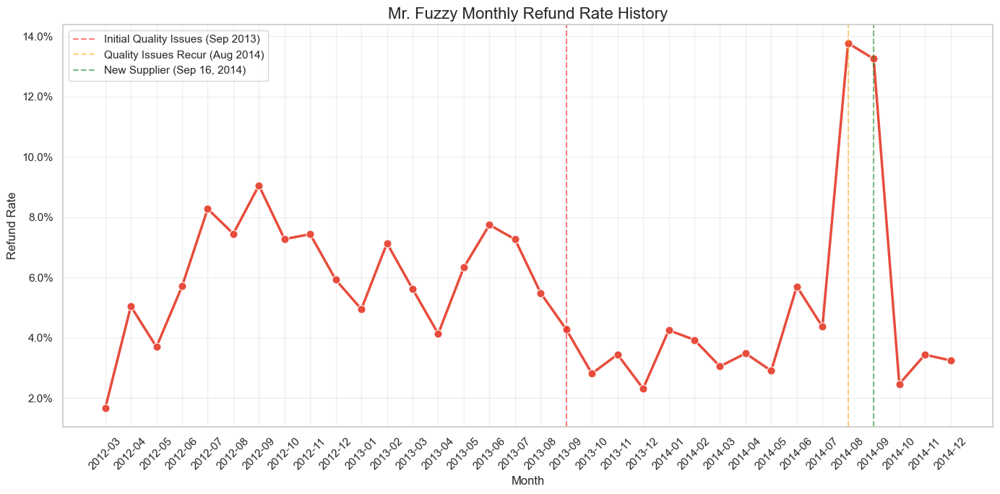

In [486]:
plt.figure(figsize=(14, 7))
ax = sns.lineplot(
    data=refund_rates[refund_rates['product_id'] == 1],
    x=refund_rates[refund_rates['product_id'] == 1]['year_month'].astype(str),
    y='refund_rate',
    marker='o',
    markersize=8,
    color='#e74c3c',
    linewidth=2.5
)

# Add key dates
plt.axvline(x='2013-09', color='red', linestyle='--', alpha=0.5, label='Initial Quality Issues (Sep 2013)')
plt.axvline(x='2014-08', color='orange', linestyle='--', alpha=0.5, label='Quality Issues Recur (Aug 2014)')
plt.axvline(x='2014-09', color='green', linestyle='--', alpha=0.5, label='New Supplier (Sep 16, 2014)')

plt.title('Mr. Fuzzy Monthly Refund Rate History', fontsize=16)
plt.xlabel('Month')
plt.ylabel('Refund Rate')
plt.xticks(rotation=45)
plt.gca().yaxis.set_major_formatter('{:.1%}'.format)
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

Findings:

Our analysis shows that fewer people returned Mr. Fuzzy after we made some improvements in September 2013. But as we thought, more people (13-14%) returned it in August and September because of some big quality problems. The good news is that it looks like the new supplier we started working with on September 16, 2014, has made a big difference and things are much better now. Plus, it seems like the return rates for our other products are pretty good.


### USER ANALYSIS:
Looking at how often people come back to your website is really important for understanding what your users do and how important your regular customers are. This involves checking how often customers come back to your site, understanding how they find your site when they come back, and figuring out if you’re spending more money to get them to come back through paid channels. By using information from how often people visit your site again, businesses can better understand how valuable a customer is, which can help them use their marketing channels better to be more efficient and effective.

 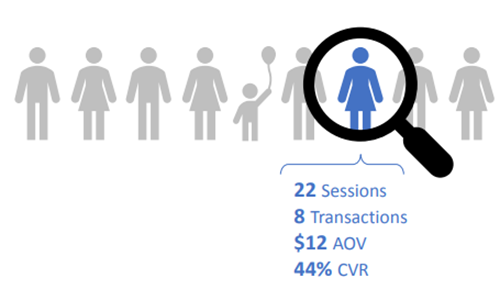
#### COMMON USE CASES: 
•	Checking how often customers visit your website again 

•	Figuring out how customers find your website when they come back, and if you’re spending more money to get them to come back through paid channels

•	Using information from how often people visit your site again to understand how valuable a customer is, which can help you use your marketing channels better. 


#### Tracking Repeat Customers Across Multiple Sessions

Businesses use things called browser cookies to keep track of what customers do over many visits. These cookies have special ID values that let the business know when a customer comes back to the website, which lets the business watch and analyze what the customer does over time. This way of tracking gives businesses useful information about what customers like, how they interact with the website, and how engaged they are. This can help businesses make their marketing more personal and targeted.
 
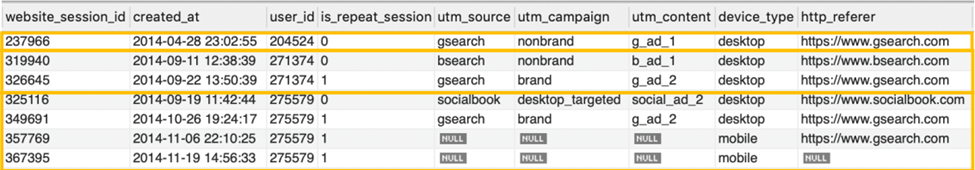

# IDENTIFYING REPEAT VISITORS

*November 01, 2014*

Could you please find out how many people visited our website more than once in 2014? This will help us understand how valuable our customers are, especially those who visit our website multiple times. If these customers are more valuable than we thought, we might be able to spend a bit more money to get new customers.


### Filter Sessions for 2014 (Before Nov 1)

In [498]:
start_date = "2014-01-01"
end_date = "2014-11-01"

df_2014 = df[(df["created_at"] >= start_date) & (df["created_at"] < end_date)]


### Identify New Sessions

In [501]:
new_sessions = df_2014[df_2014["is_repeat_session"] == 0][["user_id", "website_session_id", "created_at"]]


### Identify Repeat Sessions

In [504]:
repeat_sessions = df_2014[df_2014["is_repeat_session"] == 1][["user_id", "website_session_id", "created_at"]]


### Simulate the SQL Join Logic (Replicating session_w_repeats)

In [507]:
# Rename for clarity before merging
new_sessions = new_sessions.rename(columns={"website_session_id": "new_session_id", "created_at": "new_created_at"})
repeat_sessions = repeat_sessions.rename(columns={"website_session_id": "repeat_session_id", "created_at": "repeat_created_at"})

# Merge to simulate SQL logic
session_w_repeats = pd.merge(new_sessions, repeat_sessions, on="user_id", how="left")
session_w_repeats = session_w_repeats[session_w_repeats["repeat_session_id"] > session_w_repeats["new_session_id"]]


### Aggregate at User Level

In [510]:
user_level = session_w_repeats.groupby("user_id").agg(
    new_session_count=pd.NamedAgg(column="new_session_id", aggfunc="nunique"),
    repeat_session_count=pd.NamedAgg(column="repeat_session_id", aggfunc="nunique")
).reset_index()


### Count Users by Repeat Session Count

In [513]:
repeat_counts = user_level.groupby("repeat_session_count").agg(
    users=("user_id", "nunique")
).reset_index()
print(repeat_counts)

   repeat_session_count  users
0                     1  14086
1                     2    315
2                     3   4686


C:\Users\SAGNIK\AppData\Local\Temp\ipykernel_9936\314117161.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




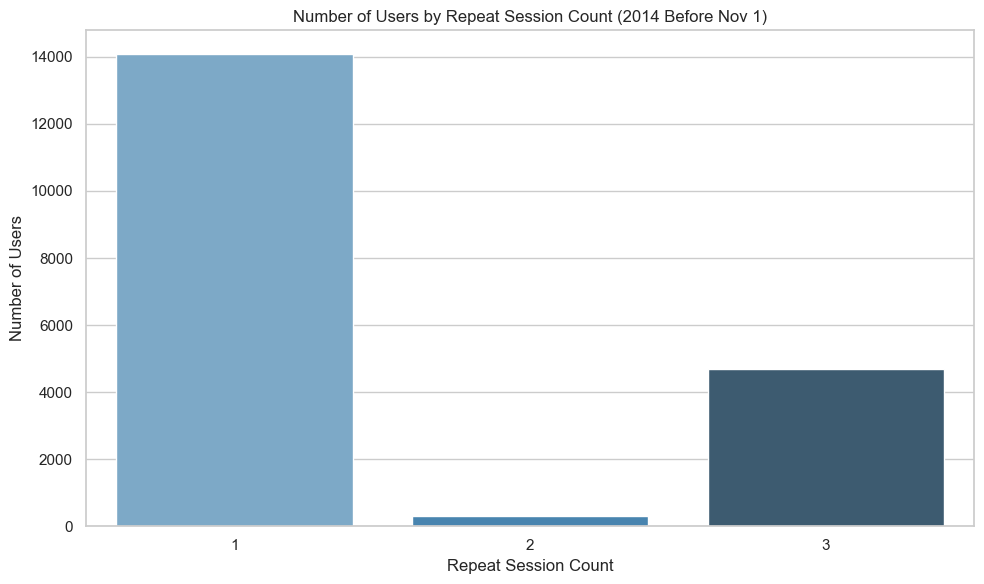

In [515]:
plt.figure(figsize=(10, 6))
sns.barplot(data=repeat_counts, x="repeat_session_count", y="users", palette="Blues_d")
plt.title("Number of Users by Repeat Session Count (2014 Before Nov 1)")
plt.xlabel("Repeat Session Count")
plt.ylabel("Number of Users")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


Findings:
 
Our analysis shows that a lot of our customers visit our website more than once. This suggests that these customers are really interested in what we offer and keep coming back to check out our website. This highlights how valuable these returning customers can be and how important it is for us to build strong relationships with them.


# ANALYZING REPEAT BEHAVIOR

*November 03, 2014*

Could you please help me understand how our repeat customers behave by finding out the shortest, longest, and average time between their first and second visit? I’m really interested in looking at this for the time period from the start of 2014 until now. This will help us understand how often and when customers who visit our website more than once come back.


In [520]:
website_sessions['created_at'] = pd.to_datetime(website_sessions['created_at'])

# Filter for 2014 data up to November 3rd
sessions_2014 = website_sessions[
    (website_sessions['created_at'] >= '2014-01-01') & 
    (website_sessions['created_at'] < '2014-11-03')
].copy()

### Identify new sessions (first visits)

In [523]:
new_sessions = sessions_2014[
    (sessions_2014['is_repeat_session'] == 0) & 
    (sessions_2014['user_id'].notna())
][['user_id', 'website_session_id', 'created_at']]

### Find repeat sessions for each user

In [526]:
repeat_sessions = pd.merge(
    new_sessions,
    sessions_2014[
        (sessions_2014['is_repeat_session'] == 1) & 
        (sessions_2014['user_id'].notna())
    ][['user_id', 'website_session_id', 'created_at']],
    on='user_id',
    suffixes=('_first', '_repeat')
)

In [528]:
# Only keep repeats that happened after the first session
repeat_sessions = repeat_sessions[
    repeat_sessions['created_at_repeat'] > repeat_sessions['created_at_first']
]

### For each user, find their second session

In [531]:
user_first_second = repeat_sessions.groupby(['user_id', 'website_session_id_first']).agg(
    first_session_date=('created_at_first', 'min'),
    second_session_date=('created_at_repeat', 'min')
).reset_index()

# Calculate days between first and second session
user_first_second['days_between'] = (user_first_second['second_session_date'] - user_first_second['first_session_date']).dt.days


### Calculate aggregate statistics

In [534]:
time_stats = user_first_second['days_between'].agg(['mean', 'min', 'max']).rename({
    'mean': 'average_days',
    'min': 'minimum_days',
    'max': 'maximum_days'
})

print("Time Between First and Second Visits (Days):")
print(f"Average: {time_stats['average_days']:.1f} days")
print(f"Minimum: {time_stats['minimum_days']} days")
print(f"Maximum: {time_stats['maximum_days']} days")


Time Between First and Second Visits (Days):
Average: 32.8 days
Minimum: 0.0 days
Maximum: 69.0 days


In [536]:
print("\nAdditional Distribution Metrics:")
print(f"Median: {user_first_second['days_between'].median():.1f} days")
print(f"25th Percentile: {user_first_second['days_between'].quantile(0.25):.1f} days")
print(f"75th Percentile: {user_first_second['days_between'].quantile(0.75):.1f} days")


Additional Distribution Metrics:
Median: 32.0 days
25th Percentile: 17.0 days
75th Percentile: 48.0 days


In [538]:
## Time-based analysis
user_first_second['first_month'] = user_first_second['first_session_date'].dt.to_period('M')
monthly_stats = user_first_second.groupby('first_month')['days_between'].agg(['mean', 'median', 'count'])

print("\nMonthly Analysis of Return Times:")
print(monthly_stats)


Monthly Analysis of Return Times:
                  mean  median  count
first_month                          
2014-01      34.576464    34.0   1674
2014-02      34.624117    35.0   1982
2014-03      34.544858    34.0   1828
2014-04      33.797923    33.0   2118
2014-05      34.202283    34.0   2190
2014-06      34.458619    34.0   2187
2014-07      34.483457    35.0   2418
2014-08      33.742821    33.5   2368
2014-09      25.690490    24.0   1777
2014-10      12.605304    12.0    641


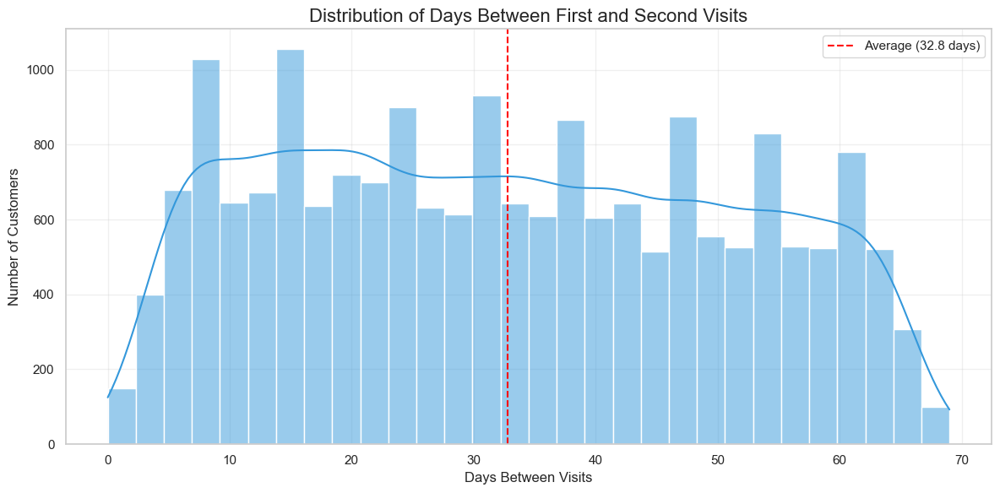

In [540]:
plt.figure(figsize=(12, 6))
sns.histplot(
    data=user_first_second,
    x='days_between',
    bins=30,
    color='#3498db',
    kde=True
)
plt.title('Distribution of Days Between First and Second Visits', fontsize=16)
plt.xlabel('Days Between Visits')
plt.ylabel('Number of Customers')
plt.axvline(x=time_stats['average_days'], color='red', linestyle='--', label=f'Average ({time_stats["average_days"]:.1f} days)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

Findings:

Our analysis shows that, on average, customers who visit our website more than once usually come back about a month later. This makes us want to look into how these customers are finding our website when they come back. Knowing how they find our website can give us useful information about how well different ways of reaching our customers are working and help us come up with better ways to keep these repeat customers engaged.


# NEW VS REPEAT CHANNEL PATTERNS

*November 05, 2014*

Could you please help me understand how our repeat customers are finding our website? I’m really interested in knowing if they’re mostly just typing in our website directly or if we’re getting them to come back through paid ads multiple times. It would be really helpful to compare how new and repeat customers are finding our website. If possible, could you get this information for 2014 until now?


In [545]:
website_sessions['created_at'] = pd.to_datetime(website_sessions['created_at'])

# Filter for 2014 data up to November 5th
sessions_2014 = website_sessions[
    (website_sessions['created_at'] >= '2014-01-01') & 
    (website_sessions['created_at'] < '2014-11-05')
].copy()

### Detailed Channel Analysis

In [548]:
channel_detail = sessions_2014.groupby(['utm_source', 'utm_campaign', 'http_referer']).agg(
    new_sessions=('website_session_id', lambda x: sum(sessions_2014.loc[x.index, 'is_repeat_session'] == 0)),
    repeat_sessions=('website_session_id', lambda x: sum(sessions_2014.loc[x.index, 'is_repeat_session'] == 1))
).reset_index().sort_values('repeat_sessions', ascending=False)

print("Detailed Channel Analysis:")
display(channel_detail.head(10))

Detailed Channel Analysis:


,utm_source,utm_campaign,http_referer,new_sessions,repeat_sessions
2,gsearch,brand,https://www.gsearch.com,5196,8897
0,bsearch,brand,https://www.bsearch.com,1236,2130
1,bsearch,nonbrand,https://www.bsearch.com,19672,0
3,gsearch,nonbrand,https://www.gsearch.com,100278,0
4,socialbook,desktop_targeted,https://www.socialbook.com,2557,0
5,socialbook,pilot,https://www.socialbook.com,5095,0


### Channel Group Analysis

In [551]:
def categorize_channel(row):
    if pd.isna(row['utm_source']) and row['http_referer'] in ['https://www.gsearch.com', 'https://www.bsearch.com']:
        return 'organic_search'
    elif row['utm_campaign'] == 'nonbrand':
        return 'paid_nonbrand'
    elif row['utm_campaign'] == 'brand':
        return 'paid_brand'
    elif pd.isna(row['utm_source']) and pd.isna(row['http_referer']):
        return 'direct_type_in'
    elif row['utm_source'] == 'socialbook':
        return 'paid_social'
    else:
        return 'other'

sessions_2014['channel_group'] = sessions_2014.apply(categorize_channel, axis=1)

channel_group_analysis = sessions_2014.groupby('channel_group').agg(
    new_sessions=('website_session_id', lambda x: sum(sessions_2014.loc[x.index, 'is_repeat_session'] == 0)),
    repeat_sessions=('website_session_id', lambda x: sum(sessions_2014.loc[x.index, 'is_repeat_session'] == 1))
).reset_index().sort_values('repeat_sessions', ascending=False)

print("\nChannel Group Analysis:")
display(channel_group_analysis)


Channel Group Analysis:


,channel_group,new_sessions,repeat_sessions
1,organic_search,7139,11507
2,paid_brand,6432,11027
0,direct_type_in,6591,10564
3,paid_nonbrand,119950,0
4,paid_social,7652,0


### Calculate percentages

In [553]:
channel_group_analysis['new_pct'] = channel_group_analysis['new_sessions'] / channel_group_analysis['new_sessions'].sum()
channel_group_analysis['repeat_pct'] = channel_group_analysis['repeat_sessions'] / channel_group_analysis['repeat_sessions'].sum()


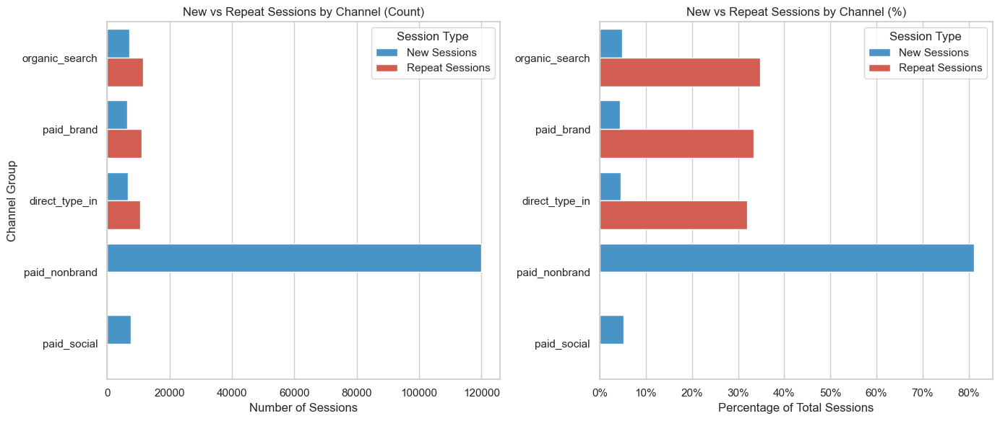

In [554]:
# Prepare melted data for both counts and percentages
channel_group_melt = channel_group_analysis.melt(
    id_vars='channel_group',
    value_vars=['new_sessions', 'repeat_sessions'],
    var_name='session_type',
    value_name='count'
)

channel_group_pct_melt = channel_group_analysis.melt(
    id_vars='channel_group',
    value_vars=['new_pct', 'repeat_pct'],
    var_name='session_type',
    value_name='percentage'
)

# Clean column names for display
channel_group_pct_melt['session_type'] = channel_group_pct_melt['session_type'].replace({
    'new_pct': 'New Sessions',
    'repeat_pct': 'Repeat Sessions'
})

channel_group_melt['session_type'] = channel_group_melt['session_type'].replace({
    'new_sessions': 'New Sessions',
    'repeat_sessions': 'Repeat Sessions'
})

# Plot
plt.figure(figsize=(14, 6))

# 1. Absolute count barplot
plt.subplot(1, 2, 1)
sns.barplot(
    data=channel_group_melt,
    x='count',
    y='channel_group',
    hue='session_type',
    palette=['#3498db', '#e74c3c']
)
plt.title('New vs Repeat Sessions by Channel (Count)')
plt.xlabel('Number of Sessions')
plt.ylabel('Channel Group')
plt.legend(title='Session Type')

# 2. Percentage barplot
plt.subplot(1, 2, 2)
sns.barplot(
    data=channel_group_pct_melt,
    x='percentage',
    y='channel_group',
    hue='session_type',
    palette=['#3498db', '#e74c3c']
)
plt.title('New vs Repeat Sessions by Channel (%)')
plt.xlabel('Percentage of Total Sessions')
plt.gca().xaxis.set_major_formatter('{:.0%}'.format)
plt.ylabel('')
plt.legend(title='Session Type')

plt.tight_layout()
plt.show()


Findings:

Our analysis shows that when customers visit our website again, they mostly find us through organic search, directly typing in our website, and paid ads for our brand. Interestingly, only about one-third of these repeat visits are through paid ads. It’s also worth noting that clicks on ads for our brand cost less than clicks on non-brand ads. Overall, we’re not spending a lot of money for these repeat visits, which suggests that we’re not paying a lot for customers to come back. 


# NEW VS REPEAT PERFORMANCE

*November 08, 2014*

Could you please help me compare how often people who visit our website for the first time and people who visit our website more than once end up buying something? Also, could you find out how much money we make for each visit for these two groups? I’d like to use data from 2014 until now. This will help us understand how the behavior of new and returning customers is different. 


In [561]:
website_sessions['created_at'] = pd.to_datetime(website_sessions['created_at'])
orders['created_at'] = pd.to_datetime(orders['created_at'])

# Filter for 2014 data up to November 8th
sessions_2014 = website_sessions[
    (website_sessions['created_at'] >= '2014-01-01') & 
    (website_sessions['created_at'] < '2014-11-08')
].copy()

### Merge sessions with orders

In [564]:
merged_data = pd.merge(
    sessions_2014,
    orders[['website_session_id', 'order_id', 'price_usd']],
    on='website_session_id',
    how='left'
)


### Calculate key metrics by session type

In [567]:
performance = merged_data.groupby('is_repeat_session').agg(
    sessions=('website_session_id', 'nunique'),
    orders=('order_id', 'nunique'),
    total_revenue=('price_usd', 'sum')
).reset_index()

# Derived metrics
performance['conversion_rate'] = performance['orders'] / performance['sessions']
performance['revenue_per_session'] = performance['total_revenue'] / performance['sessions']

# Label session type
performance['session_type'] = np.where(
    performance['is_repeat_session'] == 0,
    'New Visitors',
    'Repeat Visitors'
)

# Display results
display_results = performance[['session_type', 'sessions', 'orders', 'conversion_rate', 'revenue_per_session']].copy()
display_results['conversion_rate'] = display_results['conversion_rate'].map('{:.1%}'.format)
display_results['revenue_per_session'] = display_results['revenue_per_session'].map('${:,.2f}'.format)

print("New vs Repeat Visitor Performance (2014):")
display(display_results)

New vs Repeat Visitor Performance (2014):


,session_type,sessions,orders,conversion_rate,revenue_per_session
0,New Visitors,149787,10179,6.8%,$4.34
1,Repeat Visitors,33577,2724,8.1%,$5.17


C:\Users\SAGNIK\AppData\Local\Temp\ipykernel_9936\2927409663.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\SAGNIK\AppData\Local\Temp\ipykernel_9936\2927409663.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




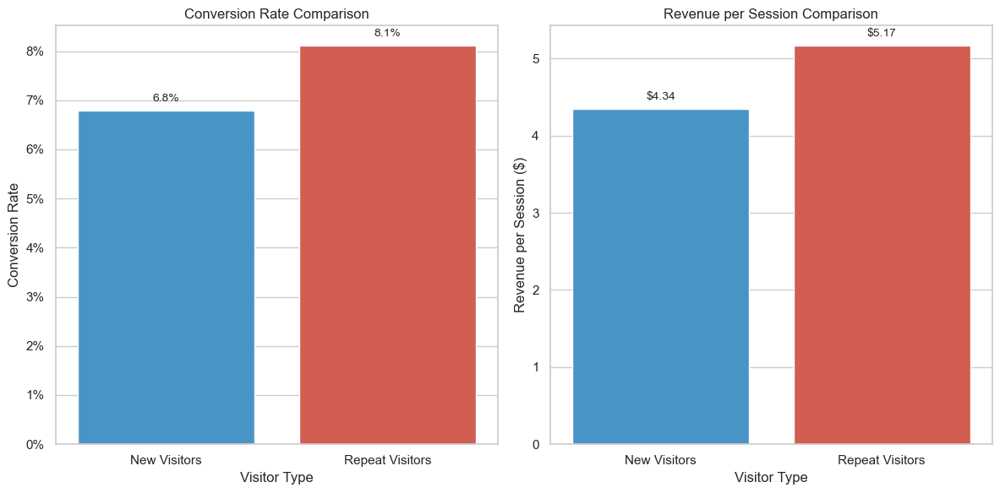

In [569]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
ax = sns.barplot(
    data=performance,
    x='session_type',
    y='conversion_rate',
    palette=['#3498db', '#e74c3c']
)
plt.title('Conversion Rate Comparison')
plt.xlabel('Visitor Type')
plt.ylabel('Conversion Rate')
plt.gca().yaxis.set_major_formatter('{:.0%}'.format)

# Add data labels
for p in ax.patches:
    ax.annotate(f"{p.get_height():.1%}", 
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 10),
                textcoords='offset points', fontsize=10)

plt.subplot(1, 2, 2)
ax = sns.barplot(
    data=performance,
    x='session_type',
    y='revenue_per_session',
    palette=['#3498db', '#e74c3c']
)
plt.title('Revenue per Session Comparison')
plt.xlabel('Visitor Type')
plt.ylabel('Revenue per Session ($)')

# Add data labels
for p in ax.patches:
    ax.annotate(f"${p.get_height():.2f}", 
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 10),
                textcoords='offset points', fontsize=10)

plt.tight_layout()
plt.show()



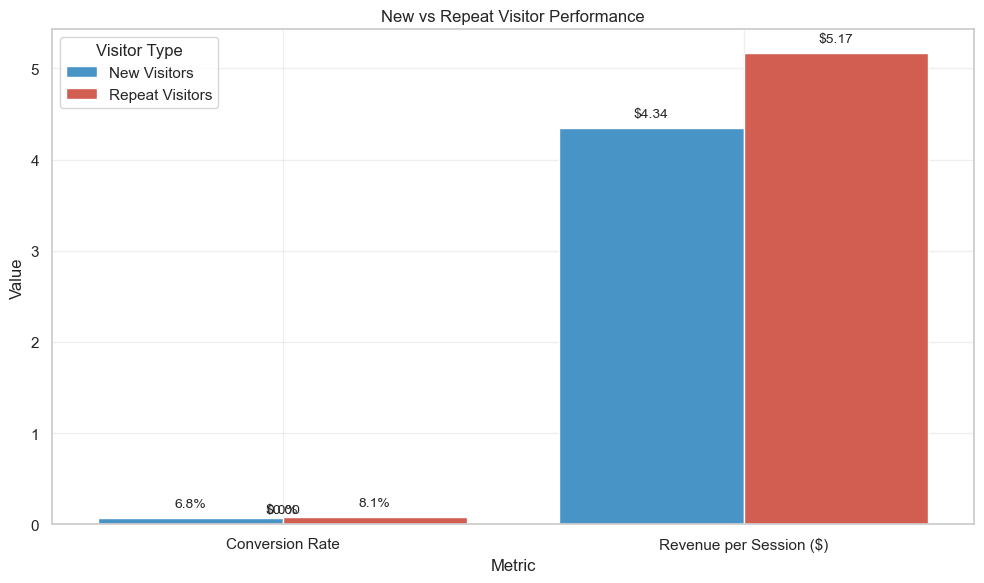

In [571]:
# 3. Combined Metric View
melted_data = performance.melt(
    id_vars=['session_type'],
    value_vars=['conversion_rate', 'revenue_per_session'],
    var_name='metric',
    value_name='value'
)

metric_names = {
    'conversion_rate': 'Conversion Rate',
    'revenue_per_session': 'Revenue per Session ($)'
}

plt.figure(figsize=(10, 6))
ax = sns.barplot(
    data=melted_data,
    x='metric',
    y='value',
    hue='session_type',
    palette=['#3498db', '#e74c3c']
)
plt.title('New vs Repeat Visitor Performance')
plt.xlabel('Metric')
plt.ylabel('Value')
plt.xticks([0, 1], [metric_names[x] for x in melted_data['metric'].unique()])
plt.legend(title='Visitor Type')

# Annotate bars
for i, bar in enumerate(ax.patches):
    metric_index = i % 2  # 0 = New, 1 = Repeat
    height = bar.get_height()
    if metric_index == 0:
        ax.annotate(f"{height:.1%}",
                    (bar.get_x() + bar.get_width() / 2., height),
                    ha='center', va='center', xytext=(0, 10),
                    textcoords='offset points', fontsize=10)
    else:
        ax.annotate(f"${height:.2f}",
                    (bar.get_x() + bar.get_width() / 2., height),
                    ha='center', va='center', xytext=(0, 10),
                    textcoords='offset points', fontsize=10)

plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


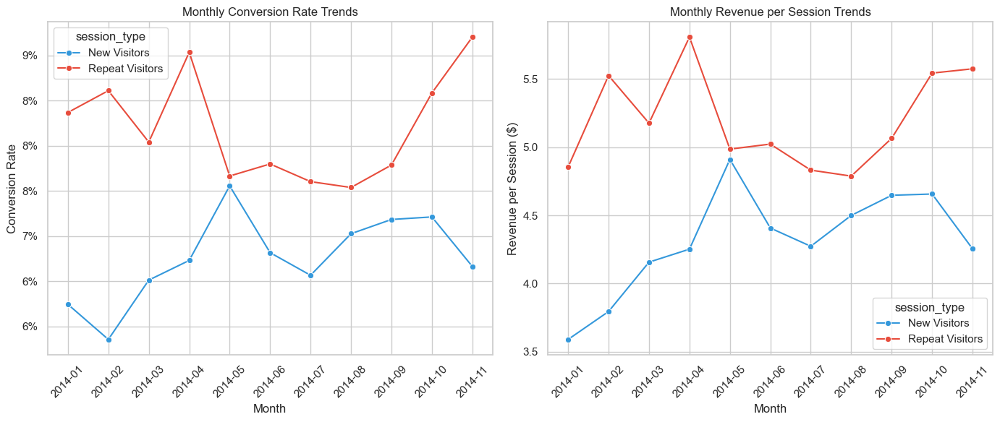

In [573]:
merged_data['month'] = merged_data['created_at'].dt.to_period('M')
monthly_performance = merged_data.groupby(['month', 'is_repeat_session']).agg(
    sessions=('website_session_id', 'nunique'),
    orders=('order_id', 'nunique'),
    revenue=('price_usd', 'sum')
).reset_index()

monthly_performance['conversion_rate'] = monthly_performance['orders'] / monthly_performance['sessions']
monthly_performance['revenue_per_session'] = monthly_performance['revenue'] / monthly_performance['sessions']
monthly_performance['session_type'] = np.where(
    monthly_performance['is_repeat_session'] == 0,
    'New Visitors',
    'Repeat Visitors'
)

# Plot monthly trends
plt.figure(figsize=(14, 6))

# Conversion Rate Trend
plt.subplot(1, 2, 1)
sns.lineplot(
    data=monthly_performance,
    x=monthly_performance['month'].astype(str),
    y='conversion_rate',
    hue='session_type',
    palette=['#3498db', '#e74c3c'],
    marker='o'
)
plt.title('Monthly Conversion Rate Trends')
plt.xlabel('Month')
plt.ylabel('Conversion Rate')
plt.gca().yaxis.set_major_formatter('{:.0%}'.format)
plt.xticks(rotation=45)

# Revenue per Session Trend
plt.subplot(1, 2, 2)
sns.lineplot(
    data=monthly_performance,
    x=monthly_performance['month'].astype(str),
    y='revenue_per_session',
    hue='session_type',
    palette=['#3498db', '#e74c3c'],
    marker='o'
)
plt.title('Monthly Revenue per Session Trends')
plt.xlabel('Month')
plt.ylabel('Revenue per Session ($)')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

Findings:
 

Our analysis shows some interesting things. People who visit our website more than once are more likely to buy something and they bring in more money for each visit compared to people who visit our website for the first time. Since we’re not spending a lot of money for these repeat visits, it’s important to think about them when we decide how much to bid for paid traffic. I’ll work with Tom to figure out how we can use this information to make our approach better.
